# Geospatial Analysis and Representation for Data Science 

### Francesca Padovani - Num. Matricola 221788

### Analysis of Data from Inside Airbnb 
(http://insideairbnb.com/get-the-data.html)


Before every cell of code I justify the type of operation I conduct, and what is used for.

In [1]:
#import required libraries 
import datetime
import requests
import time
import pandas as pd
import geopandas as gpd
import folium
from branca.element import Figure
from folium.plugins import HeatMap
from geopy.geocoders import Nominatim
import osmnx as ox
from shapely.ops import transform
import pyproj
from shapely.geometry import Point, LineString, Polygon, MultiPolygon
import pyrosm
import matplotlib.pyplot as plt
import contextily as ctx
import numpy as np
import seaborn as sns
from geopy.geocoders import Nominatim
from pykml import parser
from IPython.display import Image

Here below I list all the libraries used in this project and the corrisponding version required to run it 

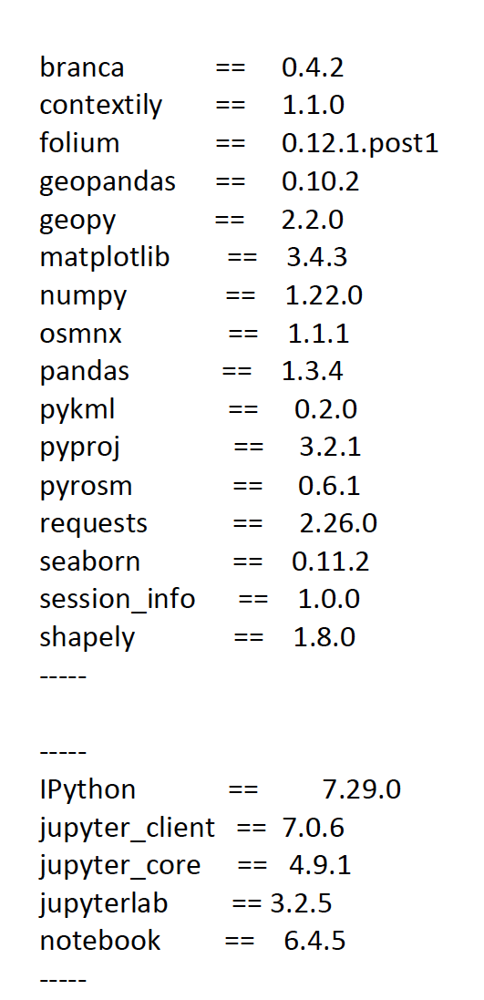

In [3]:
Image(filename='/Users/FrancescaPadovani/Desktop/MAGISTRALE DATA SCIENCE/SECONDO ANNO/GEOSPATIAL ANALYSIS/PROGETTO_PROVE/Francesca_Padovani_Geospatial/icone_immagini/libraries.png')

In [4]:
#open and read the geojson file of neighborhoods, found in Inside Airbnb
rome_neigh = gpd.read_file("Neigh_listing/neighbourhoods.geojson")

In [5]:
rome_neigh

,neighbourhood,neighbourhood_group,geometry
0,I Centro Storico,None,"MULTIPOLYGON (((12.44396 41.93390, 12.44472 41..."
1,III Monte Sacro,None,"MULTIPOLYGON (((12.56321 42.07464, 12.56269 42..."
2,IV Tiburtina,None,"MULTIPOLYGON (((12.63542 41.95729, 12.63696 41..."
3,VI Roma delle Torri,None,"MULTIPOLYGON (((12.70671 41.93375, 12.70691 41..."
4,VII San Giovanni/Cinecittà,None,"MULTIPOLYGON (((12.51668 41.89194, 12.52266 41..."
5,VIII Appia Antica,None,"MULTIPOLYGON (((12.48108 41.87642, 12.48137 41..."
6,IX Eur,None,"MULTIPOLYGON (((12.47554 41.84734, 12.47616 41..."
7,X Ostia/Acilia,None,"MULTIPOLYGON (((12.35255 41.80295, 12.35351 41..."
8,XI Arvalia/Portuense,None,"MULTIPOLYGON (((12.28997 41.82954, 12.28645 41..."
9,XII Monte Verde,None,"MULTIPOLYGON (((12.25065 41.87581, 12.24905 41..."


In [6]:
del rome_neigh['neighbourhood_group']

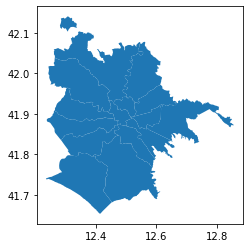

In [7]:
rome_neigh.plot()

plt.show()

With the dissolve function I manage to obtain the geographical coordinate of the entire city perimeter and then I plot it.

In [8]:
rome_neigh['city'] = 'Rome'

In [9]:
rome = rome_neigh[['geometry', 'city']].dissolve(by = 'city')

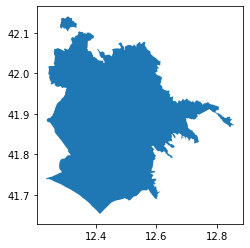

In [10]:
rome.plot()
plt.show()

## 1. Analysis of the population density (comparison with the school distribution)

#### 1.1 Analysis of the school dataset

Here below I open and read the dataset of the schools (all grades from kindergarten to high school) all around Italy and then I filter for those in the province of Rome. 

In [11]:
#open file 
anagrafica = pd.read_csv('all_dataset/anagrafica_2.csv', on_bad_lines='skip', encoding= 'latin1', delimiter = ';')

In [12]:
anagrafica.head(5)

,ISTAT_COM,ISTAT_PROV,ISTAT_REG,ISTAT_REG_7C,codice_scuola,denominazione,des_tipo_scuola,indirizzo,comune,cap,telefono,fax,email,pec,sito_web,cod_istituto_principale,statale
0,37039,37,8,1000008,BORC00350N,I.P.C. G. BRUNO - SEZ. ASSOCIATA SERALE,SCUOLA SECONDARIA DI SECONDO GRADO,VIA MAZZINI 371,MOLINELLA,NaN,NaN,NaN,BOIS00300A@istruzione.it,NaN,NaN,BORC00302A,STATALE
1,37032,37,8,1000008,BORC012014,CASSIANO DA IMOLA,SCUOLA SECONDARIA DI SECONDO GRADO,VIALE DANTE N.1/A,IMOLA,40026,054225751,054229841,BOIS012005@istruzione.it,NaN,www.paolinicassiano.it,BOIS012005,STATALE
2,37020,37,8,1000008,BORC01500E,SUORE VISITANDINE,SCUOLA SECONDARIA DI SECONDO GRADO,V.PALESTRO 8,CASTEL SAN PIETRO TERME,40024,051 941122,051 6951852,SEGRETERIA@VISITANDINE.IT,NaN,NaN,BORC01500E,PARITARIA
3,37006,37,8,1000008,BORC01601B,MANFREDI,SCUOLA SECONDARIA DI SECONDO GRADO,VIALE FELSINA 40,BOLOGNA,40139,0516039610,0516011006,BOIS01600C@istruzione.it,NaN,www.manfreditanari.it,BOIS01600C,STATALE
4,37040,37,8,1000008,BORC01603D,IP MANFREDI SEZIONE ASSOCIATA,SCUOLA SECONDARIA DI SECONDO GRADO,"VIA MICHELE DEI RAMAZZOTTI, 22",MONGHIDORO,40063,0516554050,0516554050,BOIS01600C@istruzione.it,NaN,www.manfreditanari.it,BOIS01600C,STATALE


In [13]:
#subset the dataset 
scuole_roma = anagrafica[anagrafica['comune'] == 'ROMA']

In [14]:
#keep only some columns of interest
scuole_roma = scuole_roma[['codice_scuola', 'denominazione', 'des_tipo_scuola', 'indirizzo', 'comune', 'cap', 'statale', 'cod_istituto_principale']]

In [15]:
#here I create the geodataframe of the schools 
geo_scuole = gpd.GeoDataFrame(
    scuole_roma,
    crs='EPSG:4326')

/var/folders/vv/l7jlyypd0n9d_2f1phl7rl_80000gn/T/ipykernel_16894/916751800.py:2: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  geo_scuole = gpd.GeoDataFrame(


In [16]:
geo_scuole.head()

,codice_scuola,denominazione,des_tipo_scuola,indirizzo,comune,cap,statale,cod_istituto_principale
41137,RMMM47700D,SMS J.J. WINCKELMANN,SCUOLA SECONDARIA DI PRIMO GRADO,"PIAZZA WINCKELMANN, 20",ROMA,00162,STATALE,RMMM47700D
41138,RMMM478009,"VIA U. BOCCIONI, 12",SCUOLA SECONDARIA DI PRIMO GRADO,VIA U. BOCCIONI 12,ROMA,00197,STATALE,RMMM478009
41139,RMMM480009,S.S. I GRADO SINOPOLI,SCUOLA SECONDARIA DI PRIMO GRADO,"VIA PIETRO MASCAGNI, 172",ROMA,00199,STATALE,RMMM480009
41140,RMMM481005,"PIAZZA FILATTIERA, 84",SCUOLA SECONDARIA DI PRIMO GRADO,PIAZZA FILATTIERA 84,ROMA,00139,STATALE,RMMM481005
41141,RMMM482001,SMS CESARE PIVA,SCUOLA SECONDARIA DI PRIMO GRADO,"VIA VAL DI LANZO,187",ROMA,00141,STATALE,RMMM482001


In [17]:
# add some details of city and country in the address column, they are needed for the geocoding operation
geo_scuole['indirizzo'] =[str(x) +', Roma, IT'  for x in geo_scuole['indirizzo']]
geo_scuole.head(3)

,codice_scuola,denominazione,des_tipo_scuola,indirizzo,comune,cap,statale,cod_istituto_principale
41137,RMMM47700D,SMS J.J. WINCKELMANN,SCUOLA SECONDARIA DI PRIMO GRADO,"PIAZZA WINCKELMANN, 20, Roma, IT",ROMA,00162,STATALE,RMMM47700D
41138,RMMM478009,"VIA U. BOCCIONI, 12",SCUOLA SECONDARIA DI PRIMO GRADO,"VIA U. BOCCIONI 12, Roma, IT",ROMA,00197,STATALE,RMMM478009
41139,RMMM480009,S.S. I GRADO SINOPOLI,SCUOLA SECONDARIA DI PRIMO GRADO,"VIA PIETRO MASCAGNI, 172, Roma, IT",ROMA,00199,STATALE,RMMM480009


In [619]:
#don't run again, it takes ages
geolocator = Nominatim(user_agent="example app")

In [620]:
#geocoding - did it once and then stored the final geodataframe in order to access it easily later, without applying this expensive operation every time
indirizzi = list(geo_scuole['indirizzo'])
geometrie = []
for ele in indirizzi:
    geometrie.append(gpd.tools.geocode(ele, provider="arcgis")['geometry'].values[0])

KeyboardInterrupt: 

In [ ]:
geo_scuole['geometry'] = geometrie

In [24]:
#save it to file, hence when we work again with this dataset we don't need to geocode again
geo_scuole.to_file('scuole_roma.geojson', driver='GeoJSON') 

AttributeError: No geometry data set yet (expected in column 'geometry'.)

In [18]:
#open the saved file 
geo_scuole = gpd.read_file('scuole_roma.geojson')
geo_scuole.head(3)

,codice_scuola,denominazione,des_tipo_scuola,indirizzo,comune,cap,statale,cod_istituto_principale,geometry
0,RMMM47700D,SMS J.J. WINCKELMANN,SCUOLA SECONDARIA DI PRIMO GRADO,"PIAZZA WINCKELMANN, 20, Roma, IT, Roma, IT",ROMA,00162,STATALE,RMMM47700D,POINT (12.52307 41.92155)
1,RMMM478009,"VIA U. BOCCIONI, 12",SCUOLA SECONDARIA DI PRIMO GRADO,"VIA U. BOCCIONI 12, Roma, IT, R...",ROMA,00197,STATALE,RMMM478009,POINT (12.48695 41.92731)
2,RMMM480009,S.S. I GRADO SINOPOLI,SCUOLA SECONDARIA DI PRIMO GRADO,"VIA PIETRO MASCAGNI, 172, Roma, IT, Roma, IT",ROMA,00199,STATALE,RMMM480009,POINT (12.51923 41.93646)


In [19]:
#join the two dataset and add the neighbourhood in which each school is located and the geometry 
scuole_and_neigh = gpd.sjoin(rome_neigh, 
                             geo_scuole , how='inner', op='contains')

/usr/local/anaconda3/geo/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3364: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


In [20]:
#group schools by neighbourhood and count them
numero_scuole = scuole_and_neigh.groupby(["neighbourhood"])["codice_scuola"].count().reset_index()

In [21]:
numero_scuole

,neighbourhood,codice_scuola
0,I Centro Storico,236
1,II Parioli/Nomentano,162
2,III Monte Sacro,132
3,IV Tiburtina,135
4,IX Eur,148
5,V Prenestino/Centocelle,172
6,VI Roma delle Torri,177
7,VII San Giovanni/Cinecittà,223
8,VIII Appia Antica,119
9,X Ostia/Acilia,165


In [22]:
#merge the two dataset using neighbourhood column as key
numero_scuole = pd.merge(numero_scuole,rome_neigh, on = 'neighbourhood')

In [23]:
#change name to column 
numero_scuole = numero_scuole.rename(columns={'codice_scuola': 'school_count'})

In [24]:
#obtain the geodataframe
numero_scuole = gpd.GeoDataFrame(
    numero_scuole,
    crs='EPSG:4326')

In [25]:
#save the dataframe to a geojson file
numero_scuole.to_file('scuola_a_roma.geojson', driver='GeoJSON')
numero_scuole

,neighbourhood,school_count,geometry,city
0,I Centro Storico,236,"MULTIPOLYGON (((12.44396 41.93390, 12.44472 41...",Rome
1,II Parioli/Nomentano,162,"MULTIPOLYGON (((12.50098 41.94215, 12.50117 41...",Rome
2,III Monte Sacro,132,"MULTIPOLYGON (((12.56321 42.07464, 12.56269 42...",Rome
3,IV Tiburtina,135,"MULTIPOLYGON (((12.63542 41.95729, 12.63696 41...",Rome
4,IX Eur,148,"MULTIPOLYGON (((12.47554 41.84734, 12.47616 41...",Rome
5,V Prenestino/Centocelle,172,"MULTIPOLYGON (((12.61538 41.89946, 12.61529 41...",Rome
6,VI Roma delle Torri,177,"MULTIPOLYGON (((12.70671 41.93375, 12.70691 41...",Rome
7,VII San Giovanni/Cinecittà,223,"MULTIPOLYGON (((12.51668 41.89194, 12.52266 41...",Rome
8,VIII Appia Antica,119,"MULTIPOLYGON (((12.48108 41.87642, 12.48137 41...",Rome
9,X Ostia/Acilia,165,"MULTIPOLYGON (((12.35255 41.80295, 12.35351 41...",Rome


Here I use matplotlib to produce a choropleth of the school distribution in Rome.

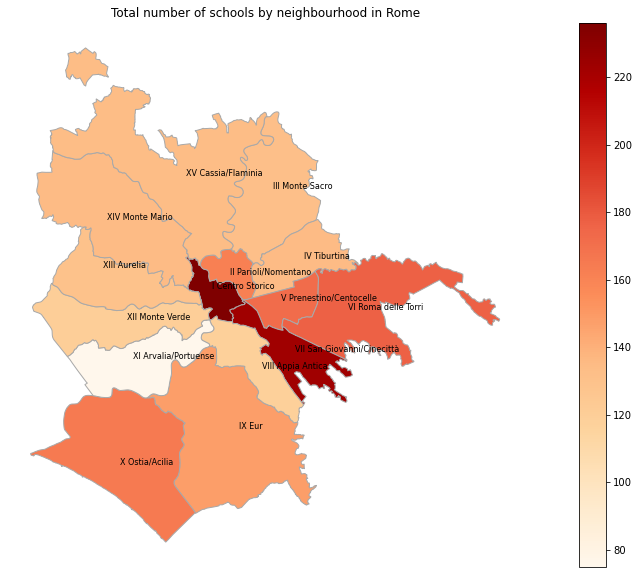

In [623]:
ax = numero_scuole.plot(column = 'school_count', 
                      legend = True, 
                      cmap="OrRd", edgecolor = "darkgrey", figsize = [20,10]) 

ax.set_axis_off()
ax.set_title('Total number of schools by neighbourhood in Rome')

# Add neighbourhood names
for multi, name in zip(numero_scuole.geometry, numero_scuole.neighbourhood):
    plt.text(multi.representative_point().x, multi.representative_point().y, name, fontsize=8, color="black")

plt.show()

I use the library **folium** to obtain an interactive web map.

In [27]:
# Centroid of the city of Rome
c_y = rome.geometry.representative_point()[0].y
c_x = rome.geometry.representative_point()[0].x

# Create basemap (I changes tiles from before and used OpenStreetMap)
fig0 = Figure(width = 800, height = 800)
map0 = folium.Map(location = [c_y,c_x], tiles = 'OpenStreetMap', zoom_start = 10)

folium.GeoJson(
    numero_scuole,
    style_function=lambda feature: {
        'fillColor': 'white',
        'color': 'black',
        'weight': 0.5
    }
    ).add_to(map0)

fig0.add_child(map0)

# Generate choropleth map 
folium.Choropleth(
    geo_data = "scuola_a_roma.geojson",
    data = numero_scuole,
    columns=["neighbourhood",'school_count'],
    key_on = 'feature.properties.neighbourhood',
    fill_color = 'Reds', 
    legend_name = "Rome").add_to(map0)

# Add tooltips
folium.features.GeoJson(data = numero_scuole,
                        name = 'Labels',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        tooltip = folium.features.GeoJsonTooltip(
                                fields= ['neighbourhood', 'school_count'],
                                aliases = ['municipio','tot_scuole'],
                                labels=True,
                                sticky=False,
                            style=("background-color: white; color: #333333; font-family: garamond; font-size: 13px; padding: 10px;")
                                                                            )
                        ).add_to(map0)
# Add title
title_html = '''
            <h3 align="center" style="font-size:20px"><b>Total number of schools per neighborhood</b></h3>
             '''
map0.get_root().html.add_child(folium.Element(title_html))

map0

Here I take data from Facebook, open and preprocess them. 

Here you can find the source link: 
(https://data.humdata.org/dataset/italy-high-resolution-population-density-maps-demographic-estimates)

In [28]:
#We define a bounding box of Rome borders
bbox = rome.geometry.bounds.values[0]
#bbox

In [29]:
#read csv of the population and restrict it by lat and long values
population_ita = pd.read_csv('all_dataset/population_ita_2019-07-01.csv') 
population_ita = population_ita[(population_ita['Lat'] < 42.140903) & (population_ita['Lat'] > 41.653319) & (population_ita['Lon'] < 12.855982) & (population_ita['Lon'] > 12.234348)]

In [30]:
#create the geodataframe 
popolazione = gpd.GeoDataFrame(
    population_ita,
    crs='EPSG:4326', geometry = gpd.points_from_xy(population_ita.Lon, population_ita.Lat))

In [31]:
popolazione

,Lat,Lon,Population,geometry
1546,42.108194,12.490417,0.414046,POINT (12.49042 42.10819)
1547,42.105417,12.488472,0.414046,POINT (12.48847 42.10542)
1550,42.109028,12.492361,0.414046,POINT (12.49236 42.10903)
1551,42.107639,12.489306,0.414046,POINT (12.48931 42.10764)
1552,42.105139,12.489028,0.414046,POINT (12.48903 42.10514)
...,...,...,...,...
24342009,41.743750,12.619583,3.455729,POINT (12.61958 41.74375)
24342011,41.872639,12.619583,16.192624,POINT (12.61958 41.87264)
24342014,41.867083,12.695417,14.784569,POINT (12.69542 41.86708)
24342015,41.740972,12.622361,3.455729,POINT (12.62236 41.74097)


Here I wanted to sum all the population entries whose geometry where contained in the same neighbourhood polygon. 
I used this piece of code to do that, it not very linear and computationally efficient, but it works. 

In [33]:
#lista contains single geodataframe of each neighbourhood 
lista_ = []
popolazione['neighbourhood'] = None

for i, ele in rome_neigh.iterrows():
    poly = ele['geometry']
    neighb = ele['neighbourhood']
    popol = popolazione[popolazione['geometry'].within(poly)]
    popol = gpd.GeoDataFrame(
        popol,
        crs='EPSG:4326')
    
    popol['neighbourhood'] = neighb
    lista_.append(popol)
    

In [34]:
#concatenate all the single geodataframe created before
gdf_completo = gpd.GeoDataFrame(pd.concat(lista_, ignore_index=True))

In [35]:
#sum the quantity of population per neighbourhood 
pop = gdf_completo.groupby(["neighbourhood"])["Population"].sum().reset_index()

In [36]:
#merge the table with the rome_neigh to obtain the geographical coordinates of the neighbourhood
population = pd.merge(rome_neigh, pop, on = 'neighbourhood')
population

,neighbourhood,geometry,city,Population
0,I Centro Storico,"MULTIPOLYGON (((12.44396 41.93390, 12.44472 41...",Rome,152982.518536
1,III Monte Sacro,"MULTIPOLYGON (((12.56321 42.07464, 12.56269 42...",Rome,187590.015664
2,IV Tiburtina,"MULTIPOLYGON (((12.63542 41.95729, 12.63696 41...",Rome,165223.378871
3,VI Roma delle Torri,"MULTIPOLYGON (((12.70671 41.93375, 12.70691 41...",Rome,222689.039963
4,VII San Giovanni/Cinecittà,"MULTIPOLYGON (((12.51668 41.89194, 12.52266 41...",Rome,280721.825869
5,VIII Appia Antica,"MULTIPOLYGON (((12.48108 41.87642, 12.48137 41...",Rome,123058.631998
6,IX Eur,"MULTIPOLYGON (((12.47554 41.84734, 12.47616 41...",Rome,160720.667245
7,X Ostia/Acilia,"MULTIPOLYGON (((12.35255 41.80295, 12.35351 41...",Rome,204240.591341
8,XI Arvalia/Portuense,"MULTIPOLYGON (((12.28997 41.82954, 12.28645 41...",Rome,136788.308878
9,XII Monte Verde,"MULTIPOLYGON (((12.25065 41.87581, 12.24905 41...",Rome,128499.688719


In [37]:
#I took this data about geographical area of the neighbourhood from Wikipedia
surface =  {'I Centro Storico': 20.09,
            'II Parioli/Nomentano':19.66,
            'III Monte Sacro':98.03,
            'IV Tiburtina': 48.94,
            'V Prenestino/Centocelle': 26.92,
            'VI Roma delle Torri': 113.88,
            'VII San Giovanni/Cinecittà': 45.84,
            'VIII Appia Antica': 47.15,
            'IX Eur':183.31,
            'X Ostia/Acilia': 150.74,
            'XI Arvalia/Portuense': 71.48,
            'XII Monte Verde':73.07,
            'XIII Aurelia':66.93,
            'XIV Monte Mario': 133.55,
            'XV Cassia/Flaminia': 187.31}

In [38]:
#add the area of each neighbourhood
population['area'] = [surface[ele['neighbourhood']] for i,ele in population.iterrows()]

In [39]:
population

,neighbourhood,geometry,city,Population,area
0,I Centro Storico,"MULTIPOLYGON (((12.44396 41.93390, 12.44472 41...",Rome,152982.518536,20.09
1,III Monte Sacro,"MULTIPOLYGON (((12.56321 42.07464, 12.56269 42...",Rome,187590.015664,98.03
2,IV Tiburtina,"MULTIPOLYGON (((12.63542 41.95729, 12.63696 41...",Rome,165223.378871,48.94
3,VI Roma delle Torri,"MULTIPOLYGON (((12.70671 41.93375, 12.70691 41...",Rome,222689.039963,113.88
4,VII San Giovanni/Cinecittà,"MULTIPOLYGON (((12.51668 41.89194, 12.52266 41...",Rome,280721.825869,45.84
5,VIII Appia Antica,"MULTIPOLYGON (((12.48108 41.87642, 12.48137 41...",Rome,123058.631998,47.15
6,IX Eur,"MULTIPOLYGON (((12.47554 41.84734, 12.47616 41...",Rome,160720.667245,183.31
7,X Ostia/Acilia,"MULTIPOLYGON (((12.35255 41.80295, 12.35351 41...",Rome,204240.591341,150.74
8,XI Arvalia/Portuense,"MULTIPOLYGON (((12.28997 41.82954, 12.28645 41...",Rome,136788.308878,71.48
9,XII Monte Verde,"MULTIPOLYGON (((12.25065 41.87581, 12.24905 41...",Rome,128499.688719,73.07


##### Double Bar Plot 

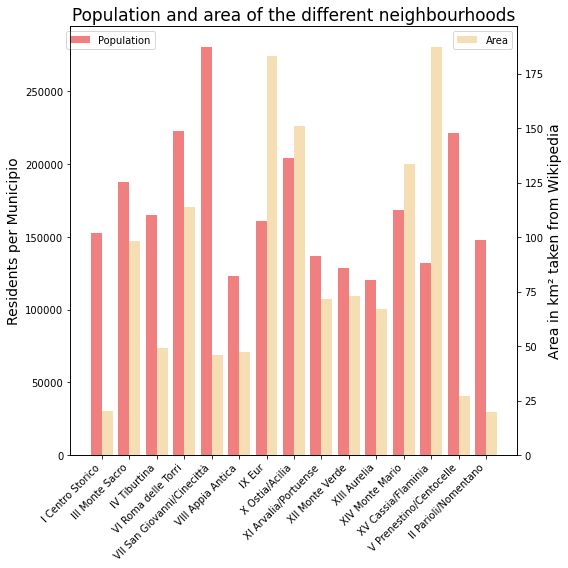

In [46]:
# these are the variables to compare and to plot (two y and one x)
neighbour = population["neighbourhood"]
pop_ = population["Population"]
area = population["area"]

# label locations
x = np.arange(15)  
width = 0.40  # Width of the bars 

# First barplot, y axis on the right
fig, ax1 = plt.subplots(1,figsize= (8,8))
color = 'tab:red'
ax1.bar(x - width/2, pop_, width, label='Population', color="lightcoral")
ax1.set_xticks(x)
ax1.set_xticklabels(neighbour, rotation = 45, ha="right")
ax1.set_ylabel('Residents per Municipio', size = 14)
ax1.set_title('Population and area of the different neighbourhoods', size = 17)
ax1.legend(bbox_to_anchor = (0.2,1))

# Second Barplot wiht the y axis on the left
ax2 = ax1.twinx()  # second axes that shares the same x-axis
ax2.bar(x + width/2, area, width, label='Area', color="wheat")
ax2.set_ylabel('Area in km² taken from Wikipedia', size = 14)
ax2.legend(loc='upper right')

fig.tight_layout()
plt.show()

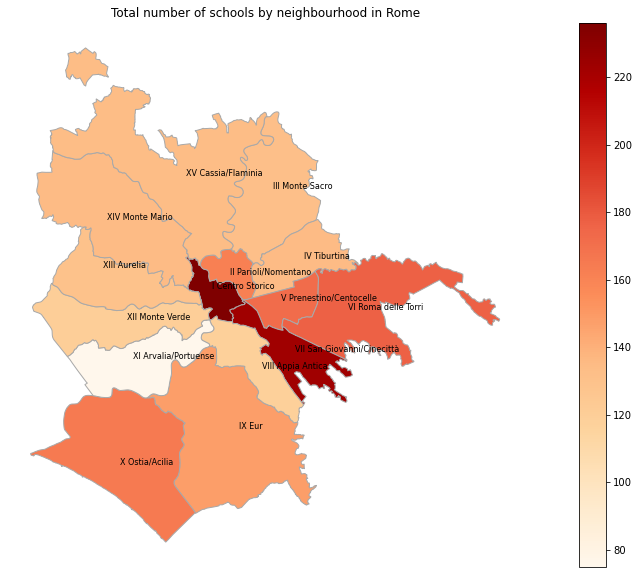

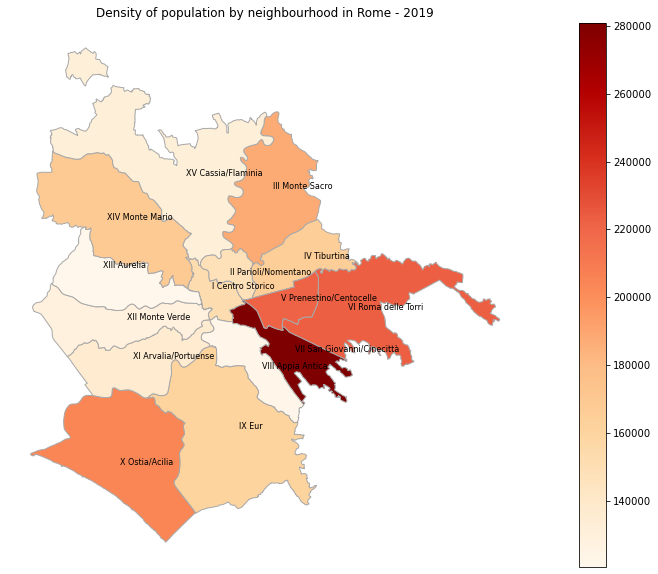

In [47]:
#Plot also a choropleth map with matplotlib


axes1 =  numero_scuole.plot(column = 'school_count', #assign data to plot
                      legend = True, #allow the legend to be displayed
                      cmap="OrRd", edgecolor = "darkgrey", figsize = [20,10]) #costumize the legend

axes1.set_axis_off()
axes1.set_title('Total number of schools by neighbourhood in Rome')

for poly, n in zip(numero_scuole.geometry, numero_scuole.neighbourhood):
    plt.text(poly.representative_point().x, poly.representative_point().y, n, fontsize=8, color="black")
    
    


axes2 = population.plot(column = 'Population', #assign data to plot
                      legend = True, #allow the legend to be displayed
                      cmap="OrRd", edgecolor = "darkgrey", figsize = [20,10]) #costumize the legend

axes2.set_axis_off()
axes2.set_title('Density of population by neighbourhood in Rome - 2019')

for poly, n in zip(population.geometry, population.neighbourhood):
    plt.text(poly.representative_point().x, poly.representative_point().y, n, fontsize=8, color="black")
    
    


plt.show()

## 2. Pharmacies in Rome

Here below I parse the **kml file** I obtained from this siteweb (https://www.google.com/maps/d/u/0/viewer?mid=1T4TAHJSW86yP4-3-7LB_WZjfIKexY_ci&ll=42.125409660543845%2C13.617582984463183&z=8) and I obtain the name of the pharmacies that are conducting the rapid swab all around the region of Lazio.

In [48]:
filename = 'farmacie/ELENCO NON ESAUSTIVO DELLE FARMACIE CHE ESEGUONO TAMPONI ANTIGENICI RAPIDI PER COVID-19 A CARICO DEL CITTADINO - LAZIO.kml'

In [49]:
#I save the name of the pharmacies in nomi_trapidi list
with open(filename) as f:
    folder = parser.parse(f).getroot().Document.Folder

nomi_trapidi = []
for pm in folder.Placemark:
    nomi_trapidi.append(pm.name)

Here I open the file of registered italian pharmacies and I subset it, keeping only those in the province of Rome.

In [50]:
#open file 
farmacie_italia = pd.read_csv('farmacie/farmacie_italia.CSV', encoding = 'latin1', delimiter = ';')

/usr/local/anaconda3/geo/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (5) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [51]:
#keep pharmacies in Rome
farmacie_roma = farmacie_italia[farmacie_italia['DESCRIZIONECOMUNE'] == 'ROMA']

In [52]:
#modify the field 'DESCRIZIONEFARMACIA' and prepare it for geocoding operation
farmacie_roma['DESCRIZIONEFARMACIA'] = [far.upper().strip() for far in farmacie_roma['DESCRIZIONEFARMACIA']]

/var/folders/vv/l7jlyypd0n9d_2f1phl7rl_80000gn/T/ipykernel_16894/3272160255.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  farmacie_roma['DESCRIZIONEFARMACIA'] = [far.upper().strip() for far in farmacie_roma['DESCRIZIONEFARMACIA']]


In [53]:
# here I add a new column in my dataset, with value True if that pharmacy does do rapid swab and False if that pharmacy doesn't do rapid swab
farmacie_roma['tamponi_rapidi'] = ['True' if riga['DESCRIZIONEFARMACIA'] in nomi_trapidi else 'False' for i, riga in farmacie_roma.iterrows()]

/var/folders/vv/l7jlyypd0n9d_2f1phl7rl_80000gn/T/ipykernel_16894/2933403044.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  farmacie_roma['tamponi_rapidi'] = ['True' if riga['DESCRIZIONEFARMACIA'] in nomi_trapidi else 'False' for i, riga in farmacie_roma.iterrows()]


In [54]:
farmacie_roma['INDIRIZZO'] = [ele + ', Roma' for ele in farmacie_roma['INDIRIZZO']]

/var/folders/vv/l7jlyypd0n9d_2f1phl7rl_80000gn/T/ipykernel_16894/2338431641.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  farmacie_roma['INDIRIZZO'] = [ele + ', Roma' for ele in farmacie_roma['INDIRIZZO']]


In [637]:
#don't run again, it takes ages
geolocator = Nominatim(user_agent="example app")

In [638]:
#geolocate the pharmacies in Rome
indirizzi = list(farmacie_roma['INDIRIZZO'])
geometrie = []
for ele in indirizzi:
    geometrie.append(gpd.tools.geocode(ele, provider="arcgis")['geometry'].values[0])

KeyboardInterrupt: 

In [ ]:
#add the geometry in the dataset 
farmacie_roma['geometry'] = geometrie

In [ ]:
#trasform the pandas dataframe in a geomandas object 
farmacie_roma = gpd.GeoDataFrame(farmacie_roma, crs='EPSG:4326')

In [45]:
#save it to file
farmacie_roma.to_file('farmacie_roma.geojson', driver='GeoJSON') 

In [55]:
#open the file
farmacie_roma = gpd.read_file('farmacie_roma.geojson')

In [56]:
#visualize the file
farmacie_roma.head()

,CODICEIDENTIFICATIVOFARMACIA,CODFARMACIAASSEGNATODAASL,INDIRIZZO,DESCRIZIONEFARMACIA,PARTITAIVA,CAP,CODICECOMUNEISTAT,DESCRIZIONECOMUNE,FRAZIONE,CODICEPROVINCIAISTAT,...,DESCRIZIONEREGIONE,DATAINIZIOVALIDITA,DATAFINEVALIDITA,DESCRIZIONETIPOLOGIA,CODICETIPOLOGIA,LATITUDINE,LONGITUDINE,LOCALIZE,tamponi_rapidi,geometry
0,9082,0,"Via G. Branca, 62, Roma",AMOROSO SACCHETTA GIOVANNI,00424570588,153,58091,ROMA,-,58,...,LAZIO,01/01/2005,30/09/2010,Ordinaria,1,"41,9236809188458","12,5711488038565",1,False,POINT (12.47563 41.88103)
1,9082,0,"Via G. Branca, 62, Roma",AMOROSO SACCHETTA GIOVANNI,01241670585,153,58091,ROMA,-,58,...,LAZIO,01/10/2010,-,Ordinaria,1,"41,9236809188458","12,5711488038565",1,False,POINT (12.47563 41.88103)
2,9083,0,"Via Tagliamento, 58/60, Roma",BONSIGNORI GIUSEPPE,01405530583,198,58091,ROMA,-,58,...,LAZIO,01/01/2005,31/05/2019,Ordinaria,1,"41,4614273073245","12,6886350499022",1,False,POINT (12.50445 41.92092)
3,9083,0,"Via Tagliamento, 58/60, Roma",FARMACIA BONSIGNORI S.A.S. DI GIUSEPPE BONSIGN...,14828021007,192,58091,ROMA,-,58,...,LAZIO,01/06/2019,-,Ordinaria,1,"41,4614273073245","12,6886350499022",1,False,POINT (12.50445 41.92092)
4,9084,0,"Via dei Serpenti, 177, Roma",ENEI LILIANA,00988150587,184,58091,ROMA,-,58,...,LAZIO,01/07/2007,-,Ordinaria,1,"41,8961570811524","12,4902049402707",1,False,POINT (12.49084 41.89429)


I obtained these coordinate from this siteweb (https://boundingbox.klokantech.com/) and they are useful because they define the boundaries of Rome (area inside the GRA - Grande Raccordo Anulare), totally excluding the X Ostia neighbourhood.

In [57]:
min_x = 12.387296
min_y = 41.800124
max_x = 12.609284
max_y = 41.97816


polygon = Polygon([[min_x, min_y], [max_x, min_y], [max_x, max_y], [min_x, max_y]])

In [58]:
#keep only pharmacies inside that polygon
farmacie_roma = farmacie_roma[farmacie_roma['geometry'].within(polygon)] 

In [59]:
#I delete the duplicates names
farmacie_roma = farmacie_roma.drop_duplicates(subset = ['DESCRIZIONEFARMACIA']) 

In [60]:
# I calculate the number of pharmacies inside our polygon that offer the rapid swabs service 
num_rapid_swab = len(farmacie_roma[farmacie_roma['tamponi_rapidi'] == 'True'])
print("The total number of pharmacies doing rapid swabs in Rome is %s, not too many." % num_rapid_swab)

The total number of pharmacies doing rapid swabs in Rome is 40, not too many.


In [61]:
#I use this function that we defined in a class lecture in order to obtain markers (in this case of pharmacies)
def getMarker(lat,lon, message,tip,inconstyle):
    marker = folium.Marker(location=[lat,lon],
                         popup=message,
                         tooltip=tip,
                         icon=inconstyle)
    return marker

In [62]:
# I use the representative point of the city of rome to instantiate the map
rep_rome = [rome.geometry.representative_point()[0].y, rome.geometry.representative_point()[0].x]

# I create the basemap
map1 =folium.Map(location=rep_rome,zoom_start=13)

#I add the markers (uncomment the code below to plot also the other active pharmacies that don't provide the rapid swabs offer)
for index, row in farmacie_roma.iterrows():
    if row['tamponi_rapidi'] == 'True':
        
        icon=folium.features.CustomIcon('icone_immagini/blue_points.jpg',icon_size=(20,20))
        marker = getMarker(row.geometry.y,row.geometry.x,row['DESCRIZIONETIPOLOGIA'],row['DESCRIZIONEFARMACIA'],icon)
        marker.add_to(map1)
    
    '''else:
        icon=folium.features.CustomIcon('icone_immagini/no.png',icon_size=(20,20))
        marker = getMarker(row.geometry.y,row.geometry.x,row['DESCRIZIONETIPOLOGIA'],row['DESCRIZIONEFARMACIA'],icon)
        marker.add_to(m5)'''
        
    
    
map1

## 3. Identify which are the neighborhoods with the highest prices in AirBnB
Load data and visualize listings distribution. 

#### What is the most common type of room_type?

In [63]:
#open the csv file 
strutture = pd.read_csv('neigh_listing/listings.csv')

In [64]:
#keep ONLY the accomodations that have as last review a recent date that trace back to 2021
strutture = strutture[strutture['last_review'] >'2020-12-01'] 

I guess this is more reliable because the pandemic forced many structures to close or to be sold or used for different scopes.

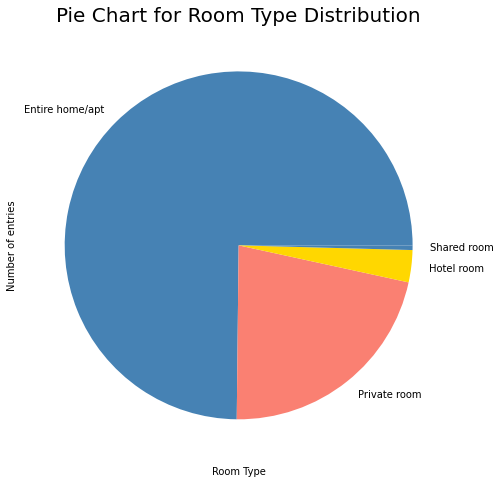

In [66]:
#here I create an intuitive pie chart showing the portion of the various room types offered by Airbnb
strutture['room_type'].value_counts().plot(kind = 'pie', colors=['steelblue', 'salmon', 'gold'], figsize = (8, 8))
plt.title('Pie Chart for Room Type Distribution', fontsize = 20)
plt.xlabel('Room Type')
plt.ylabel('Number of entries')
plt.show()

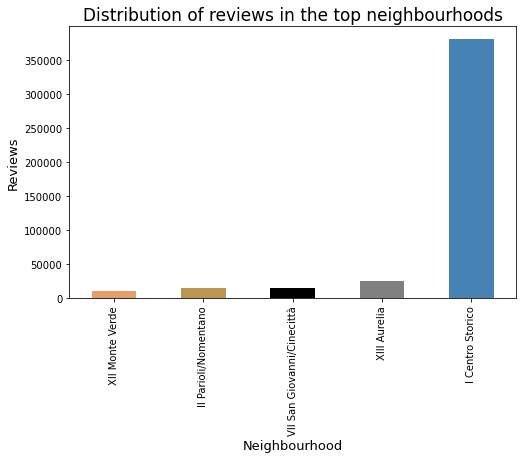

In [68]:
#here I create a bar plot of the five top districts for amount of reviews on the platform  
neighs = strutture.groupby('neighbourhood')
reviews = neighs['number_of_reviews'].sum().sort_values().tail(5)

reviews.plot(kind = 'bar', color=['#e59e6d', '#ba9653', 'black', 'grey', 'steelblue'], figsize = (8, 5))
plt.xlabel('Neighbourhood', fontsize = 13)
plt.ylabel('Reviews', fontsize = 13)
plt.title('Distribution of reviews in the top neighbourhoods', fontsize = 17)
plt.show()

In [69]:
#get the previously found neighbourhoods as a list
list_of_neighs = reviews.keys().tolist()
n_reviews = reviews.tolist()

#print it
print("Top 5 neighbourhoods are: \n")
for i,n in enumerate(list_of_neighs):
    print('{} with {} reviews'.format(n, n_reviews[i]))

Top 5 neighbourhoods are: 

XII Monte Verde with 10849 reviews
II Parioli/Nomentano with 14302 reviews
VII San Giovanni/Cinecittà with 14779 reviews
XIII Aurelia with 24717 reviews
I Centro Storico with 380036 reviews


#### What is the most expensive room type?

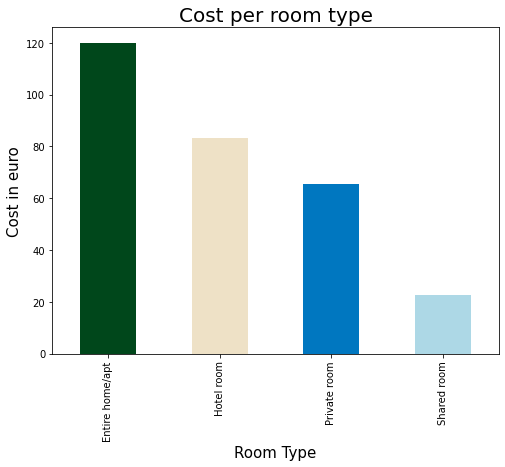

In [70]:
# I group data by room type
room_types = strutture.groupby('room_type')
# FInd out the mean value of the prices in each room type
prezzi = room_types['price'].mean().sort_values(ascending = False)
prezzi.plot(kind = 'bar', color=['#00471b', '#eee1c6', '#0077c0', 'lightblue'] ,figsize = (8, 6))
plt.title('Cost per room type', fontsize = 20)
plt.xlabel('Room Type', fontsize = 15)
plt.ylabel('Cost in euro', fontsize = 15)
plt.show()

In [71]:
#I keep the values of the bounding box calculated before to restrict the dataset, keep only airbnb which are inside the GRA
bbox = [min_x, min_y, max_x, max_y]

In [72]:
strutture = strutture[(strutture['latitude'] > bbox[1]) & (strutture['latitude'] < bbox[3])  & (strutture['longitude'] > bbox[0]) & (strutture['longitude'] < bbox[2])]
strutture.shape                                           

(6891, 18)

In [73]:
#here I create the geodataframe
rome_airbnb = gpd.GeoDataFrame(strutture,crs = 'EPSG:4326', geometry = gpd.points_from_xy(strutture.longitude, strutture.latitude))

In [74]:
#save it 
rome_airbnb.to_file('final_listings.gpkg', driver='GPKG')

### 3.1 VISUALIZATIONS Here below I try to make different graphs of the distribution of Airbnb in the Capital, with different grouping methods, as seen in class.

## HEATMAP

In [77]:
#representative point of the city of rome
rep_rome = [rome.geometry.representative_point()[0].y, rome.geometry.representative_point()[0].x]

# I create the basemap
fig3 = Figure(width = 1000, height = 1000)
map3 = folium.Map(location = rep_rome, tiles ='OpenStreetMap', zoom_start = 11)

# I create the heatmap
HeatMap(strutture[['latitude', 'longitude']]).add_to(map3)

fig3.add_child(map3)
map3.save(outfile = 'airbnb_heatmap.html')
map3

/var/folders/vv/l7jlyypd0n9d_2f1phl7rl_80000gn/T/ipykernel_16894/4262969948.py:4: FutureWarning: The "contextily.tile_providers" module is deprecated and will be removed in contextily v1.1. Please use "contextily.providers" instead.
  url=ctx.sources.ST_TERRAIN)
/var/folders/vv/l7jlyypd0n9d_2f1phl7rl_80000gn/T/ipykernel_16894/4262969948.py:3: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  ctx.add_basemap(ax,crs=rome_airbnb.to_crs(epsg=3857).crs.to_string(),


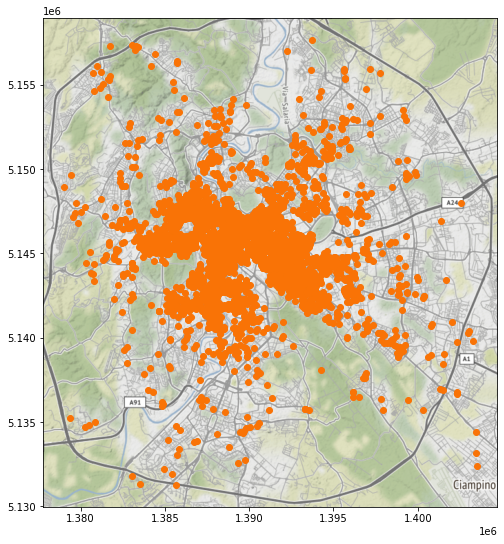

In [78]:
#it's always a good idea to use this coordinate reference system  (3857 instead of 4326)
ax = rome_airbnb.to_crs(epsg=3857).plot(color='xkcd:orange',figsize=(9,9))
ctx.add_basemap(ax,crs=rome_airbnb.to_crs(epsg=3857).crs.to_string(),
               url=ctx.sources.ST_TERRAIN)

**EPSG:3857** is a projected coordinate system used for rendering maps in Google Maps, OpenStreetMap, etc. 

**Scope**: Certain Web mapping and visualisation applications. It is not a recognised geodetic system: for that see ellipsoidal Mercator CRS code 3395 (WGS 84 / World Mercator).

In [79]:
#I produce an hard copy of the geopandas 
geo_airbnb = rome_airbnb.copy() 

In [80]:
#change coordinate reference system to 3857
geo_airbnb['x'] = geo_airbnb.to_crs(epsg=3857).geometry.x
geo_airbnb['y'] = geo_airbnb.to_crs(epsg=3857).geometry.y

In [81]:
#here I redefine the bounding box to donwload the background image
bounding_box = [geo_airbnb.x.min(), geo_airbnb.y.min(), geo_airbnb.x.max(), geo_airbnb.y.max()]

In [82]:
#basemap is an array containing the raw image data for a basemap of the area
#basemap_extent is the boundary of that image
basemap, basemap_extent = ctx.bounds2img(*bounding_box, zoom=12,source = ctx.providers.Stamen.Toner)

In [83]:
data_extent = [geo_airbnb.x.min(), geo_airbnb.x.max(), geo_airbnb.y.min(), geo_airbnb.y.max()]

## DOTS OVER A BACKGROUND IMAGE

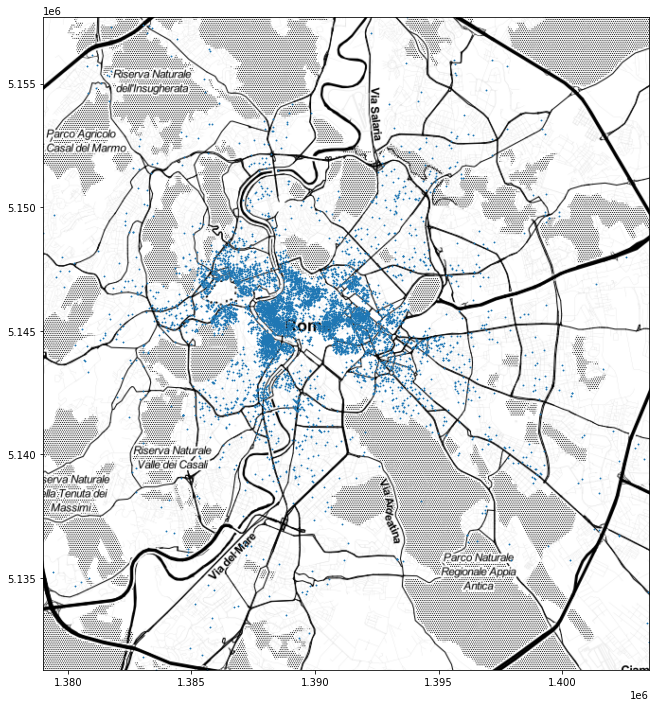

In [84]:
#figure and axis
f, ax = plt.subplots(1, figsize=(12, 12))
#add map tiles for context
ax.imshow(basemap, extent=basemap_extent, interpolation='bilinear')
# plot the points
ax.scatter(geo_airbnb['x'], geo_airbnb['y'], s=0.75) #s = size
#limit the axis
ax.axis(data_extent)
#display
plt.show()

## HEXAGONS

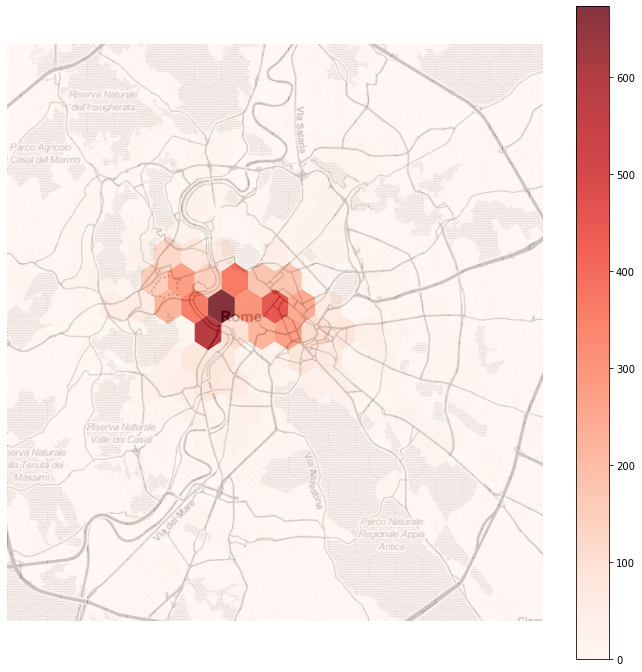

In [85]:
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(12, 12))
# Add map tiles for context
ax.imshow(basemap, extent=basemap_extent, interpolation='bilinear')

# Generate and add hexbin with 20 hexagons in each 
# dimension, no borderlines, 80% transparency (alpha),
# and the reverse Oranges colormap
hb = ax.hexbin(x=geo_airbnb['x'], 
               y=geo_airbnb['y'],
               gridsize=20, linewidths=0,
               alpha=0.8, cmap='Reds')

ax.axis(data_extent)
# Add colorbar
plt.colorbar(hb)
# Remove axes
ax.set_axis_off()

## KDE HEATMAP

"KDE lays a grid of points over the space of interest on which it places kernel functions that count points around them with different weight based on the distance. These counts are then aggregated to generate a global surface with probability. The most common kernel function is the gaussian one, which applies a normal distribution to weight points. The result is a continuous surface with a probability function that may be evaluated at every point"

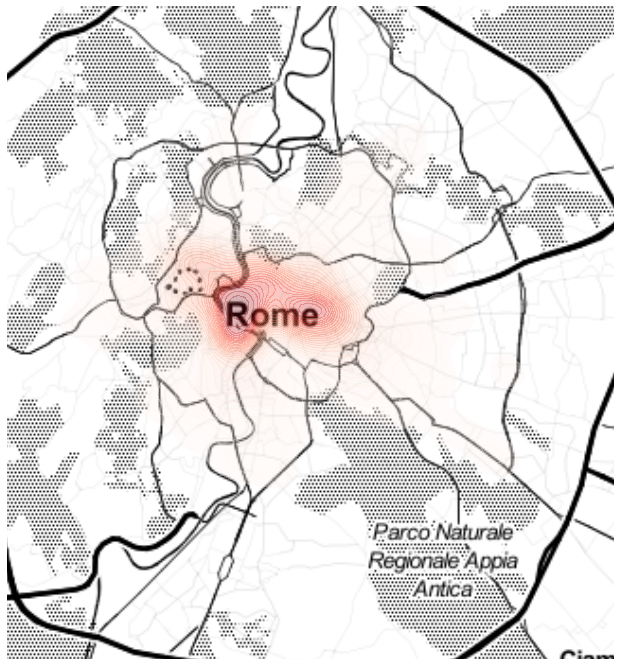

In [86]:
basemap, basemap_extent = ctx.bounds2img(*bounding_box, zoom=11,source = ctx.providers.Stamen.Toner)

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(12, 12))
# Add map tiles for context
ax.imshow(basemap, extent=basemap_extent, interpolation='bilinear')
# Generate and add KDE with a shading of 30 gradients 
# coloured contours, 30% of transparency (alpha),
# and the reverse Reds colormap
sns.kdeplot(x=geo_airbnb['x'], y=geo_airbnb['y'],
                n_levels=30, shade=True,
                alpha=0.3, cmap='Reds')
# Remove axes
ax.axis(data_extent)
ax.set_axis_off()

## ANOTHER WAY I USED TO COMPUTE THE KERNEL DENSITY ESTIMATION

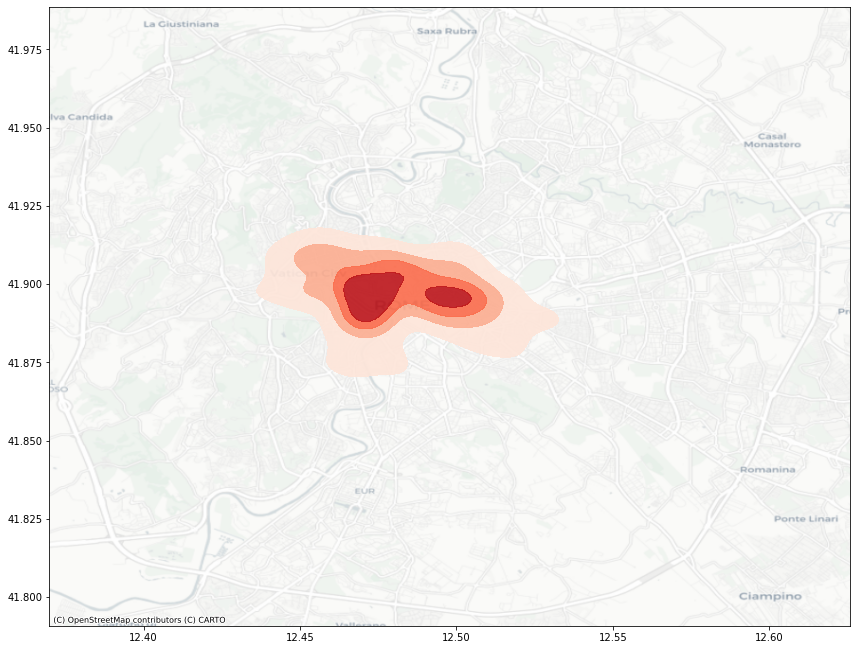

In [89]:
# Create and set thresholds
threshold = [0.2,0.4,0.6,0.8,1]

# Create plot
f, ax = plt.subplots(figsize=(12, 10))
# Kernel Density Estimation
kde = sns.kdeplot(
    ax=ax,
    x=rome_airbnb['geometry'].x,
    y= rome_airbnb['geometry'].y,
    levels = threshold,
    shade=True,
    cmap='Reds',
    alpha=0.9
)
# Add a basemap
ctx.add_basemap(ax=ax,crs = rome_airbnb.crs.to_string(), source=ctx.providers.CartoDB.Positron)
#ax.set_axis_off()
plt.tight_layout()

plt.show()


In [90]:
level_poly = []
i = 0
for col in kde.collections:
    paths = []
    # Loop through all polygons that have the same intensity level
    for contour in col.get_paths(): 
        
        # Create a polygon for the countour
        # First polygon is the main countour, the rest are holes
        for ncp,cp in enumerate(contour.to_polygons()):
            x = cp[:,0]
            y = cp[:,1]
            new_shape = Polygon([(i[0], i[1]) for i in zip(x,y)])
            if ncp == 0:
                poly = new_shape
            else:
                # Remove holes, if any
                poly = poly.difference(new_shape)

        # Append polygon to list
        paths.append(poly)
    # Create a MultiPolygon for the contour
    multi = MultiPolygon(paths)
    # Append MultiPolygon and level as tuple to list
    level_poly.append((threshold[i], multi))
    i+=1


In [91]:
#create a  DataFrame
kernel = pd.DataFrame(level_poly, columns =['threshold', 'geometry'])
# Convert to a GeoDataFrame
kernel_geo = gpd.GeoDataFrame(kernel, geometry='geometry', crs = rome_airbnb.crs)
# Set CRS for geometric operations
kernel_geo = kernel_geo.to_crs(epsg=4326)
# Calculate area
kernel_geo['area'] = kernel_geo['geometry'].area
# Save to file
kernel_geo.to_file('kernel_geo.gpkg', driver='GPKG')



/var/folders/vv/l7jlyypd0n9d_2f1phl7rl_80000gn/T/ipykernel_16894/1333461096.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  kernel_geo['area'] = kernel_geo['geometry'].area


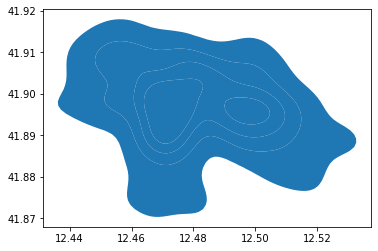

In [92]:
kernel_geo.plot()
plt.show()

## 3.2 Here we join the geodataframe of airbnb listings and airbnb neighbourhood and we compute some descriptive statistics

In [93]:
# With a spatial join operation, identify the neighbourhood where each airbnb is located
airbnb_and_neigh = gpd.sjoin(rome_neigh, 
                             rome_airbnb, how='inner', op='contains', lsuffix='n', rsuffix='a')

/usr/local/anaconda3/geo/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3364: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


In [94]:
#visualize data 
airbnb_and_neigh.head(3)

,neighbourhood_n,geometry,city,index_a,id,name,host_id,host_name,neighbourhood_group,neighbourhood_a,...,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,I Centro Storico,"MULTIPOLYGON (((12.44396 41.93390, 12.44472 41...",Rome,298,280198,Trastevere stylish two bedrooms apartment.,1460757,Paolo,NaN,I Centro Storico,...,Entire home/apt,97,2,58,2021-09-01,0.66,9,157,2,NaN
0,I Centro Storico,"MULTIPOLYGON (((12.44396 41.93390, 12.44472 41...",Rome,3506,5082409,Luxury apartment in Trastevere area,26250493,Patrizia,NaN,I Centro Storico,...,Entire home/apt,100,4,22,2021-08-29,0.33,1,282,1,NaN
0,I Centro Storico,"MULTIPOLYGON (((12.44396 41.93390, 12.44472 41...",Rome,1748,2005424,☆ BunkBeds BR in Beautiful Artsy APT in Traste...,3305730,Ernesto,NaN,I Centro Storico,...,Private room,25,1,233,2021-09-12,2.46,7,360,5,NaN


In [95]:
#keep only some columns
airbnb_and_neigh = airbnb_and_neigh[['neighbourhood_n', 'geometry', 'city', 'index_a', 'host_name', 'room_type', 'price', 'minimum_nights', 'last_review', 'number_of_reviews_ltm', 'availability_365']]

#### Which is the average price of Airbnb properties by neighborhood?

In [96]:
#group_by neighbourhood and compute the mean price on each neighbourhood
airbnb_price = airbnb_and_neigh.groupby(["neighbourhood_n"])["price"].mean().reset_index()

In [97]:
#change name to column
airbnb_price_mean = airbnb_price.rename(columns={'neighbourhood_n': 'neighbourhood', 'price':'avg_price'})

airbnb_price_mean['avg_price'] = round(airbnb_price_mean['avg_price'], 2)

In [98]:
#sort from highest average price to lowest
airbnb_price_mean.sort_values(by=['avg_price'], ascending = False)


,neighbourhood,avg_price
0,I Centro Storico,123.15
11,XIII Aurelia,83.71
10,XII Monte Verde,77.35
1,II Parioli/Nomentano,74.90
13,XV Cassia/Flaminia,72.69
12,XIV Monte Mario,71.50
4,IX Eur,70.27
7,VII San Giovanni/Cinecittà,69.75
8,VIII Appia Antica,62.89
9,XI Arvalia/Portuense,59.96


#### Which is the standard deviation of prices of Airbnb properties by neighborhood?

In [107]:
#group_by neighbourhood and compute the standard deviation of prices on each neighbourhood
airbnb_price_std = airbnb_and_neigh.groupby(["neighbourhood_n"])["price"].std().reset_index()

In [108]:
#change name to column
airbnb_price_std = airbnb_price_std.rename(columns={'neighbourhood_n': 'neighbourhood','price': 'std_price' })

airbnb_price_std['std_price'] = round(airbnb_price_std['std_price'], 2)

In [109]:
airbnb_price_std.sort_values(by=['std_price'], ascending = False)

,neighbourhood,std_price
0,I Centro Storico,216.32
10,XII Monte Verde,117.70
5,V Prenestino/Centocelle,72.21
11,XIII Aurelia,67.16
1,II Parioli/Nomentano,52.93
12,XIV Monte Mario,45.37
13,XV Cassia/Flaminia,45.34
8,VIII Appia Antica,41.69
7,VII San Giovanni/Cinecittà,40.20
4,IX Eur,32.27


In [110]:
# Merge in order to have neighbourhoods, their geometry and price in a unique dataframe, to visualize data on a map
neigh_price = pd.merge(rome_neigh, airbnb_price_mean, on = 'neighbourhood')

In [111]:
#rechange name to column 
neigh_price = neigh_price.rename(columns={'neighbourhood': 'neighbourhood_n'})

In [113]:
#round the price, keep only to decimal values
neigh_price["avg_price"] = round(neigh_price["avg_price"], 2)

In [114]:
neigh_price

,neighbourhood_n,geometry,city,avg_price
0,I Centro Storico,"MULTIPOLYGON (((12.44396 41.93390, 12.44472 41...",Rome,123.15
1,III Monte Sacro,"MULTIPOLYGON (((12.56321 42.07464, 12.56269 42...",Rome,54.89
2,IV Tiburtina,"MULTIPOLYGON (((12.63542 41.95729, 12.63696 41...",Rome,53.69
3,VI Roma delle Torri,"MULTIPOLYGON (((12.70671 41.93375, 12.70691 41...",Rome,55.43
4,VII San Giovanni/Cinecittà,"MULTIPOLYGON (((12.51668 41.89194, 12.52266 41...",Rome,69.75
5,VIII Appia Antica,"MULTIPOLYGON (((12.48108 41.87642, 12.48137 41...",Rome,62.89
6,IX Eur,"MULTIPOLYGON (((12.47554 41.84734, 12.47616 41...",Rome,70.27
7,XI Arvalia/Portuense,"MULTIPOLYGON (((12.28997 41.82954, 12.28645 41...",Rome,59.96
8,XII Monte Verde,"MULTIPOLYGON (((12.25065 41.87581, 12.24905 41...",Rome,77.35
9,XIII Aurelia,"MULTIPOLYGON (((12.30750 41.96183, 12.30996 41...",Rome,83.71


#### Interactive Choropleth Map

In [115]:
# centroid of the city of Rome
c_y = rome.iloc[0].geometry.centroid.y
c_x = rome.iloc[0].geometry.centroid.x

# create the basemap
fig4 = Figure(width = 800, height = 800)
map4 = folium.Map(location = [c_y,c_x], tiles = 'cartodbpositron', zoom_start = 10)

folium.GeoJson(
    neigh_price,
    style_function=lambda feature: {
        'fillColor': 'white',
        'color': 'black',
        'weight': 0.5
    }
    ).add_to(map4)

fig4.add_child(map4)

# Generate choropleth map 
folium.Choropleth(
    geo_data = neigh_price.to_json(),
    data = neigh_price,
    columns=['neighbourhood_n', 'avg_price'],
    key_on = 'feature.properties.neighbourhood_n',
    fill_color = 'Blues', 
    legend_name = "Average price").add_to(map4)

# add tooltips
folium.features.GeoJson(data = neigh_price,
                        name = 'Labels',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        tooltip = folium.features.GeoJsonTooltip(
                                fields= ["neighbourhood_n", "avg_price"],
                                aliases = ["Municipio", "€"],
                                labels=True,
                                sticky=False
                                                                            )
                        ).add_to(map4)
# Add title
title_html = '''
            <h3 align="center" style="font-size:20px"><b>Average Airbnb price by neighbourhood in Rome</b></h3>
             '''
map4.get_root().html.add_child(folium.Element(title_html))

map4.save(outfile = 'airbnb_price_neigh.html')
map4

#### Which is the highest price found among Airbnb accomodations by neighborhood?

In [118]:
neigh_max_price = airbnb_and_neigh.groupby(["neighbourhood_n"])["price"].max().reset_index()
neigh_max_price = neigh_max_price.rename(columns={'price': 'max_price'})
neigh_max_price.sort_values(by=['max_price'],ascending=False)

,neighbourhood_n,max_price
0,I Centro Storico,11111
10,XII Monte Verde,1800
5,V Prenestino/Centocelle,999
11,XIII Aurelia,977
1,II Parioli/Nomentano,480
7,VII San Giovanni/Cinecittà,350
8,VIII Appia Antica,344
13,XV Cassia/Flaminia,280
12,XIV Monte Mario,235
9,XI Arvalia/Portuense,180


#### Count how many Airbnb accomodations are present per neighbourhood

In [119]:
# Group by neighbourhood, count the number of airbnb and sort in descending order
airbnb_number = airbnb_and_neigh.groupby(["neighbourhood_n"]).size().to_frame('num_airbnb').reset_index()
airbnb_number.sort_values(by=['num_airbnb'],ascending=False)

,neighbourhood_n,num_airbnb
0,I Centro Storico,4885
11,XIII Aurelia,388
1,II Parioli/Nomentano,363
7,VII San Giovanni/Cinecittà,330
10,XII Monte Verde,246
5,V Prenestino/Centocelle,194
8,VIII Appia Antica,153
9,XI Arvalia/Portuense,72
12,XIV Monte Mario,68
2,III Monte Sacro,57


In [120]:
# Add geometry and sort by number of airbnb
neigh_number = pd.merge(airbnb_number, neigh_price, on = 'neighbourhood_n').sort_values(['num_airbnb'], ascending = False)
neigh_number = neigh_number.rename(columns={'price':'average_price'})

In [121]:
# I have created this tabe which summarize a bit what we have found in the previous passages
neigh_number

,neighbourhood_n,num_airbnb,geometry,city,avg_price
0,I Centro Storico,4885,"MULTIPOLYGON (((12.44396 41.93390, 12.44472 41...",Rome,123.15
11,XIII Aurelia,388,"MULTIPOLYGON (((12.30750 41.96183, 12.30996 41...",Rome,83.71
1,II Parioli/Nomentano,363,"MULTIPOLYGON (((12.50098 41.94215, 12.50117 41...",Rome,74.90
7,VII San Giovanni/Cinecittà,330,"MULTIPOLYGON (((12.51668 41.89194, 12.52266 41...",Rome,69.75
10,XII Monte Verde,246,"MULTIPOLYGON (((12.25065 41.87581, 12.24905 41...",Rome,77.35
5,V Prenestino/Centocelle,194,"MULTIPOLYGON (((12.61538 41.89946, 12.61529 41...",Rome,53.21
8,VIII Appia Antica,153,"MULTIPOLYGON (((12.48108 41.87642, 12.48137 41...",Rome,62.89
9,XI Arvalia/Portuense,72,"MULTIPOLYGON (((12.28997 41.82954, 12.28645 41...",Rome,59.96
12,XIV Monte Mario,68,"MULTIPOLYGON (((12.29248 42.03120, 12.29396 42...",Rome,71.50
2,III Monte Sacro,57,"MULTIPOLYGON (((12.56321 42.07464, 12.56269 42...",Rome,54.89


In [122]:
#create a geodataframe 
neigh_number = gpd.GeoDataFrame(
    neigh_number,
    crs='EPSG:4326')

#save it to file
neigh_number.to_file('airbnb_per_neigh.geojson', driver='GeoJSON')

In [123]:
# Centroid of the city of Rome
c_y = rome.iloc[0].geometry.centroid.y
c_x = rome.iloc[0].geometry.centroid.x

# Create basemap (I changes tiles from before and used OpenStreetMap)
fig5 = Figure(width = 800, height = 800)
map5 = folium.Map(location = [c_y,c_x], tiles = 'OpenStreetMap', zoom_start = 10)

folium.GeoJson(
    neigh_number,
    style_function=lambda feature: {
        'fillColor': 'white',
        'color': 'black',
        'weight': 0.5
    }
    ).add_to(map5)

fig5.add_child(map5)

# Generate choropleth map 
folium.Choropleth(
    geo_data = 'airbnb_per_neigh.geojson',
    data = neigh_number,
    columns=['neighbourhood_n', 'num_airbnb'],
    key_on = 'feature.properties.neighbourhood_n',
    fill_color = 'Reds', 
    legend_name = "Number of Airbnb").add_to(map5)

# Add tooltips
folium.features.GeoJson(data = neigh_number,
                        name = 'Labels',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        tooltip = folium.features.GeoJsonTooltip(
                                fields= ["neighbourhood_n", "num_airbnb"],
                                aliases = ["Municipio", "numero_Airbnb"],
                                labels=True,
                                sticky=False
                                                                            )
                        ).add_to(map5)
# Add title
title_html = '''
            <h3 align="center" style="font-size:20px"><b>Total number of Airbnb's per neighborhood</b></h3>
             '''
map5.get_root().html.add_child(folium.Element(title_html))

map5

## 5. Retrieve Data From OpenStreetMap 
The future tourist in Rome that I mentioned before really cares about her physical health and is very athletic.
#### 5.1 So she would like to know where she can go running in the morning. 

In [124]:
min_x = 12.423897
min_y = 41.84468
max_x = 12.541756
max_y = 41.951936
polygon_1 = Polygon([[min_x, min_y], [max_x, min_y], [max_x, max_y], [min_x, max_y]])

In [125]:
rome_bbox = {'description': ['bbox around Rome'], 'geometry': [polygon_1]}
rome_bbox = gpd.GeoDataFrame(rome_bbox, crs = "epsg:4326")
#rome_bbox.to_file("rome_bbox.geojson", driver = "GeoJSON")

In [126]:
# you open the pbf file of Rome
osm = pyrosm.OSM("all_dataset/Roma_poly-2022-01-05T02Z.osm.pbf", bounding_box = rome_bbox.geometry.values[0])

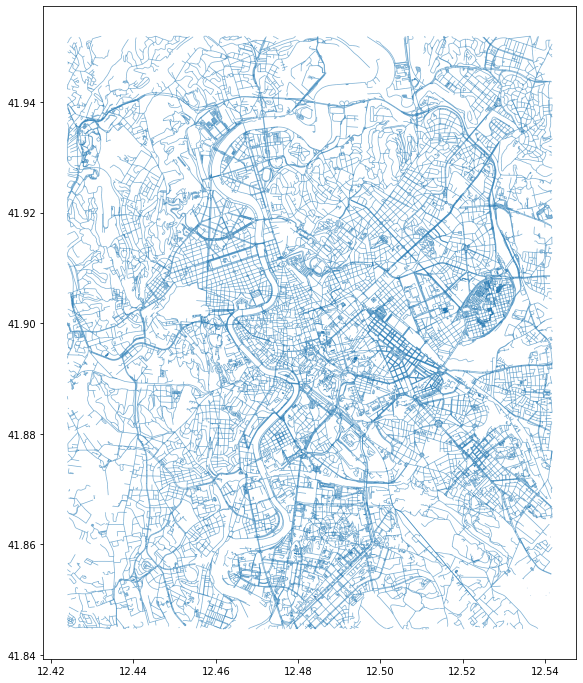

In [127]:
#you plot the walking streets network in Rome
walk = osm.get_network("walking")
walk.plot(figsize=(12,12), lw=0.7, alpha=0.6)
plt.show()

#### Analyze pedestrian paths and streets
On wikimedia I found this note that I took into account which is **country specific only for Italy**.

In Italy, access for bicycles to pedestrian areas is allowed by default. If you are mapping in Italy, you are encouraged to explicitly state bicycle=* when mapping highway=pedestrian in order to avoid ambiguity.

In [128]:
roads = osm.get_network(network_type='all')

In [129]:
roads_pedestrian = roads[(roads.highway=='pedestrian')]

In [130]:
# we see how many times each street has been count (sometimes due to intersection they are count multiple times)
roads_pedestrian['name'].value_counts()

Via Nova                13
Via Sacra                9
Piazza Jan Palach        7
Piazza Carlomagno        6
Via del Pigneto          6
                        ..
Via Pasquale Villari     1
Ponte Milvio             1
Via Flavio Sabino        1
Via Pesaro               1
Vicus Iugarius           1
Name: name, Length: 594, dtype: int64

In [131]:
# we keep only one occurrence for each
nomi_strade_pedonali = roads_pedestrian['name'].unique()

In [132]:
#we calculate the length in meter of each street
roads_lenght = {}
#I transform it because I want the length in meters
roads_in_meters = roads_pedestrian.to_crs(epsg=32632) 
for name in nomi_strade_pedonali:
    road = roads_in_meters[roads_in_meters.name==name]
    road_lenght = road.length.sum()
    roads_lenght[name] = road_lenght

In [133]:
#we ask for the longest road
longest_road = max(roads_lenght, key=roads_lenght.get)

In [134]:
# we print out the result 
print("The longest pedestrian way in Rome is %s and it's long %s kilometers." % (longest_road, round(roads_lenght[longest_road]/1000, 2)))

The longest pedestrian way in Rome is Via del Casino Algardi and it's long 1.16 kilometers.


In [135]:
#total amount of walkable surface reserved for pedestrians
total = sum(roads_lenght.values())/1000
print("The total amount of walkable surface in the central area of the capital Rome is %s kilometers." % round(total, 2))

The total amount of walkable surface in the central area of the capital Rome is 79.01 kilometers.


We can use overpass-turbo.eu with this wizard query to show where the street is located.
http://overpass-turbo.eu/s/1cuk


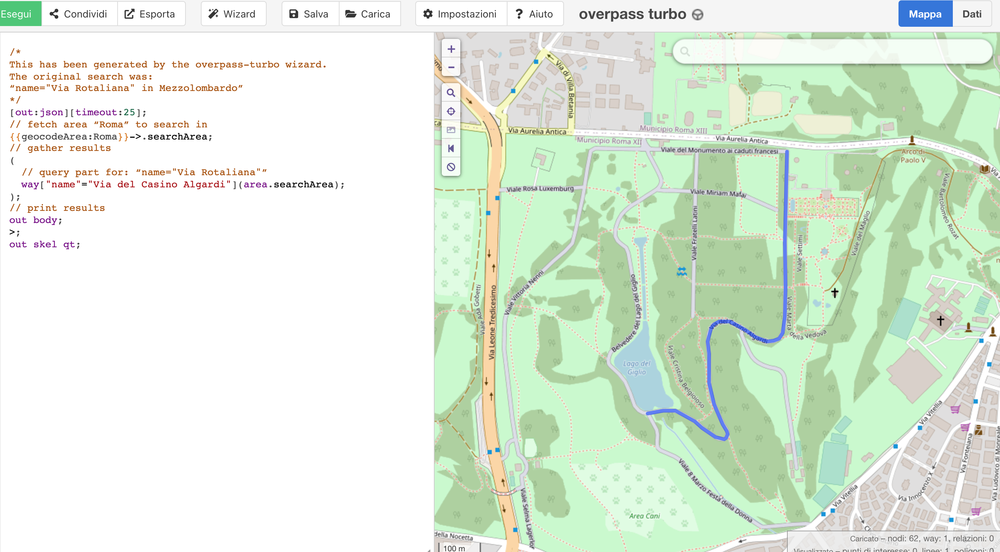

In [137]:
Image(filename='icone_immagini/via_romana.png')

The overpass turbo query shows us that the pedestrian street identified as the longest in the chosen perimeter is right inside the park of Villa Doria Pamphilj, which is the perfect place for a morning run. 

#### 5.2 Since the tourist is  vegetarian she also would like to know which are the restaurants in Rome where she can go for dinner. 
Where the vegetarian and vegan restaurants are located? 

In [138]:
#I set the filters of interest 
custom_filter = {'amenity': ['restaurant']}

In [139]:
#get the points of interest
restaurants = osm.get_pois(custom_filter=custom_filter)

/usr/local/anaconda3/geo/lib/python3.9/site-packages/pyrosm/pyrosm.py:576: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  gdf = get_poi_data(


In [140]:
#have a look at how many restaurants have been found
restaurants.shape

(1812, 30)

In [141]:
#which are the unique tags associated to our set of restaurants
restaurants.tags.unique()

array(['{"cuisine":"pizza"}',
       '{"cuisine":"chinese","diet:vegetarian":"yes"}',
       '{"cuisine":"italian","alt_name":"Filetti di baccal\\u00E0"}',
       '{"cuisine":"pizza;steak_house","oven":"wood_fired","ref:vatin":"IT07728381000","restaurant:type:it":"pizzeria;bisteccheria;sfizi"}',
       '{"cuisine":"italian","ref:vatin":"IT07813261000","wheelchair":"no"}',
       '{"cuisine":"italian"}',
       '{"cuisine":"italian_pizza;italian","wheelchair":"limited"}',
       '{"cuisine":"sardinian"}',
       '{"cuisine":"pasta","ethnicity":"Italian"}',
       '{"oven":"wood_fired","cuisine":"pizza","ref:vatin":"IT01621091006","restaurant:type:it":"pizzeria;birreria"}',
       '{"cuisine":"italian","smoking":"no","wheelchair":"yes"}', None,
       '{"cuisine":"chinese","created_by":"Potlatch 0.10f"}',
       '{"cuisine":"steak_house"}',
       '{"cuisine":"indian","wheelchair":"no"}',
       '{"note":"Pizza e Carne","oven":"wood_fired","cuisine":"italian"}',
       '{"cuisine":"regio

In [142]:
#I select the restaurant which holds the tags "diet:vegan":"yes", "diet:vegetarian":"yes", "diet:vegan":"only" and "diet:vegetarian":"only"
ristoranti_vegani_1 = restaurants[restaurants.tags.str.find('"diet:vegan":"yes"') > -1]
ristoranti_vegetariani_1 = restaurants[restaurants.tags.str.find('"diet:vegetarian":"yes"') > -1]
ristoranti_vegani_2 = restaurants[restaurants.tags.str.find('"diet:vegan":"only"') > -1]
ristoranti_vegetariani_2 = restaurants[restaurants.tags.str.find('"diet:vegetarian":"only"') > -1]

In [143]:
#I concatenate them and drop the duplicates 
finale = pd.concat([ristoranti_vegani_1, ristoranti_vegetariani_1, ristoranti_vegani_2, ristoranti_vegetariani_2])
finale = finale.drop_duplicates()

In [144]:
#keep only some columns of teh dataset 
finale = finale[['lat', 'lon', 'tags', 'name', 'opening_hours', 'operator', 'phone', 'url', 'website']]

In [145]:
#save to shapefile or geojson the data about restaurants
risto_veggies = gpd.GeoDataFrame(finale, crs='EPSG:4326', geometry=gpd.points_from_xy(finale.lon, finale.lat))

#I save the opening hours (if available) of the restaurants
open_ = []
for ele in risto_veggies['opening_hours']:
    if ele == None:
        open_.append('not_available')
    else:
        open_.append(ele)
    

In [146]:
#I create a new column
risto_veggies['opening_hours'] = open_

#I exclude these two restaurants because apparently they don't have latitude and longitude values
risto_veggies = risto_veggies[risto_veggies.name != 'Romeow Cat Bistrot']
risto_veggies = risto_veggies[risto_veggies.name != 'Zenzero biorestaurante']

#transform lat and lon in integer values
latitude = [int(ele) for ele in risto_veggies['lat']]
longitude = [int(ele) for ele in risto_veggies['lon']]

#assign the new values to the variables
risto_veggies['lat'] = latitude
risto_veggies['lon'] = longitude

In [147]:
#save to file
risto_veggies.to_file('ristoranti_veg.geojson', driver = 'GeoJSON')

In [148]:
# Extract the representative point of the city of rome
rep_rome = [rome.geometry.representative_point()[0].y, rome.geometry.representative_point()[0].x]

# Create basemap
map6 =folium.Map(location=rep_rome,zoom_start=13)

for index, row in risto_veggies.iterrows():
    icon=folium.features.CustomIcon('icone_immagini/LOGO-VEGAN.jpeg',icon_size=(20,20))
    #icon=folium.Icon(color='green',prefix='far fa',icon='-seedling')
    marker = getMarker(row.geometry.y,row.geometry.x,row['opening_hours'],row['name'],icon)
    marker.add_to(map6)
map6

In [149]:
# With a spatial join operation, identify the neighbourhood where each restaurant is located
risto_and_neigh = gpd.sjoin(rome_neigh, 
                             risto_veggies, how='inner', op='contains')

/usr/local/anaconda3/geo/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3364: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


In [150]:
#I count how many vegetarian restaurants are there per neighbourhood
ristoranti_by_neigh = risto_and_neigh.groupby(["neighbourhood"]).size().to_frame('num_ristoranti').reset_index().sort_values(['num_ristoranti', 'neighbourhood'], ascending=False)

In [151]:
ristoranti_by_neigh

,neighbourhood,num_ristoranti
0,I Centro Storico,22
3,V Prenestino/Centocelle,3
8,XIII Aurelia,2
6,XI Arvalia/Portuense,2
9,XIV Monte Mario,1
7,XII Monte Verde,1
5,VIII Appia Antica,1
4,VII San Giovanni/Cinecittà,1
2,III Monte Sacro,1
1,II Parioli/Nomentano,1


#### 5.3 Identify which are the cultural places in Rome and how they are divided by neighbourhood, localize also the supermarkets and the touristic attractions

In [153]:
#set the filter 
custom_filter_mus = {"tourism": ["museum"]}
custom_filter_attractions = {"tourism": ["attraction"], "shop": ["supermarket"]}

#retrieve information of interest
museums = osm.get_pois(custom_filter = custom_filter_mus)
attractions = osm.get_pois(custom_filter = custom_filter_attractions)

/usr/local/anaconda3/geo/lib/python3.9/site-packages/pyrosm/pyrosm.py:576: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  gdf = get_poi_data(
/usr/local/anaconda3/geo/lib/python3.9/site-packages/pyrosm/pyrosm.py:576: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  gdf = get_poi_data(


In [154]:
#this is a control that I applied in order to check if there were duplicated rows, but I didn't find any
print(attractions.shape[0] + museums.shape[0])
final = pd.concat([museums,attractions], ignore_index = True)
print(final.drop_duplicates().shape)

681
(681, 31)


In [155]:
#here I join the two dataframe with the one containing the neighbourhood informations
museums_and_neigh = gpd.sjoin(rome_neigh, 
                             museums, how='inner', op='contains')
attractions_and_neigh = gpd.sjoin(rome_neigh, 
                             attractions, how='inner', op='contains')

/usr/local/anaconda3/geo/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3364: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
/usr/local/anaconda3/geo/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3364: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


In [156]:
#I count how many museums and how many attractions + supermarkets are present in each neighbourhood
museums_by_neigh = museums_and_neigh.groupby(["neighbourhood"]).size().to_frame('num_musei').reset_index().sort_values(['num_musei', 'neighbourhood'], ascending=False)
attractions_by_neigh = attractions_and_neigh.groupby(["neighbourhood"]).size().to_frame('num_attrazioni').reset_index().sort_values(['num_attrazioni', 'neighbourhood'], ascending=False)

In [157]:
#I recover for missing neighbourhood in the museums_by_neigh table
for i, row in attractions_by_neigh.iterrows():
    n = row.neighbourhood
    if n not in list(museums_by_neigh.neighbourhood):
        d = {'neighbourhood': n, 'num_musei':0}
        museums_by_neigh = museums_by_neigh.append(d, ignore_index = True)
        
    

In [158]:
#create a unified table 
rome_tourism = pd.merge(museums_by_neigh, attractions_by_neigh, how = 'left', on = 'neighbourhood')

In [159]:
#trasform values into integers 
rome_tourism['num_attrazioni'] = rome_tourism['num_attrazioni'].apply(lambda x: int(x))
rome_tourism

,neighbourhood,num_musei,num_attrazioni
0,I Centro Storico,74,244
1,II Parioli/Nomentano,32,120
2,VIII Appia Antica,6,42
3,XII Monte Verde,1,20
4,V Prenestino/Centocelle,1,13
5,III Monte Sacro,1,13
6,VII San Giovanni/Cinecittà,0,44
7,XIV Monte Mario,0,17
8,XIII Aurelia,0,17
9,XI Arvalia/Portuense,0,13


In [160]:
#add another column 
rome_tourism["totale"] = rome_tourism["num_musei"] + rome_tourism["num_attrazioni"]

# Sort by the number of total activities in descending order 
rome_tourism.sort_values(by=['totale'], ascending = False)
dizio = {"neighbourhood":'VI Roma delle Torri', "num_musei":0,'num_attrazioni': 0, 'totale': 0 }                   
rome_tourism = rome_tourism.append(dizio, ignore_index = True)
rome_tourism

,neighbourhood,num_musei,num_attrazioni,totale
0,I Centro Storico,74,244,318
1,II Parioli/Nomentano,32,120,152
2,VIII Appia Antica,6,42,48
3,XII Monte Verde,1,20,21
4,V Prenestino/Centocelle,1,13,14
5,III Monte Sacro,1,13,14
6,VII San Giovanni/Cinecittà,0,44,44
7,XIV Monte Mario,0,17,17
8,XIII Aurelia,0,17,17
9,XI Arvalia/Portuense,0,13,13


## 6. STREET NETWORK ANALYSIS
We know that the at MAXXI Museum in Rome there's a permanent exhibition and also a temporal one that our tourist really wants to visit.
She is planning to spend more than one day there and she wants to know which are the closest Airbnb to that museums and also which vegetarian restaurants she can reach walking maximum 2.5 km from each of these chosen accomodations.

In [161]:
#geolocate the MAXXI Museum
geolocator = Nominatim(user_agent = "geospatial course")
to_be_visited = 'MAXXI Museo nazionale delle arti del XXI secolo, Roma, Italia'

location = geolocator.geocode(to_be_visited)
maxxii = (location.latitude, location.longitude)
point_maxxii = Point(maxxii[1], maxxii[0])
#point_maxxii

In [162]:
#in which neighbourhood is it located? 
municipio = rome_neigh[rome_neigh['geometry'].contains(point_maxxii)]['neighbourhood'].values[0]
print(f'Maxxii museums is located inside the {municipio} neighbourhood.')

Maxxii museums is located inside the II Parioli/Nomentano neighbourhood.


/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/utils_geo.py:335: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/utils_geo.py:426: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/utils_geo.py:426: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:


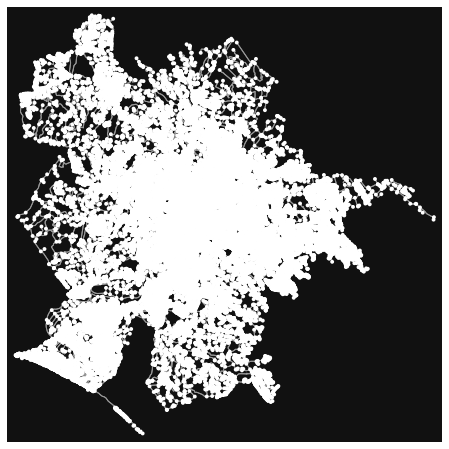

In [163]:
#retrieve and plot all the walking streets of the city
grafo = ox.graph_from_place("Rome, Italy", network_type='walk')
fig, ax = ox.plot_graph(grafo)

In [164]:
#add the speed speed and travel time
grafo = ox.add_edge_speeds(grafo)
grafo = ox.add_edge_travel_times(grafo)

In [165]:
#to create the street walking graph and plot our paths subsequently I also created the network_onx object 
nodes, edges = osm.get_network(network_type="walking", nodes=True)
network_onx = osm.to_graph(nodes, edges, graph_type="networkx")
%time

CPU times: user 4 µs, sys: 1 µs, total: 5 µs
Wall time: 10 µs


In [166]:
#get the node in the graph nearest to the maxxii museum
node_nearest_museum = ox.get_nearest_node(grafo, maxxii)

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


In [167]:
#restrict the rome_airbnb dataset only to Airbnb in Parioli/Nomentano, the district where the museum is located
rome_airbnb = rome_airbnb[rome_airbnb['neighbourhood'] == 'II Parioli/Nomentano']

In [168]:
#you find the nearest node in the graph to the airbnb accomodations in Rome
rome_airbnb["points_to_graph"] = rome_airbnb.geometry.apply(lambda x: ox.get_nearest_node(grafo, (x.y, x.x))) 

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.neare

In [169]:
#find shortest paths between the museum and each airbnb
rome_airbnb["paths_to_maxxii"] = rome_airbnb.points_to_graph.apply(lambda x: ox.shortest_path(grafo, x, node_nearest_museum, weight='travel_time'))

In [170]:
#retrieve paths' length in meters
rome_airbnb["paths_to_maxxii_m"] = rome_airbnb.paths_to_maxxii.apply(lambda x: sum(ox.utils_graph.get_route_edge_attributes(grafo, x, 'length')))

In [171]:
#sort in ascending order
rome_airbnb = rome_airbnb.sort_values(by='paths_to_maxxii_m')

The closest Airbnb we have found seems to be directly in front of the Museum and therefore we are excluding them in the next step where we plot the route from the other top three accomodations and the MAXXII Museum. 

In [174]:
rome_airbnb_top = rome_airbnb[1:4]

In [175]:
rome_airbnb_top

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,points_to_graph,paths_to_maxxii,paths_to_maxxii_m
16393,33132190,Private room in a beautiful apartment facing M...,151839653,Laura,NaN,II Parioli/Nomentano,41.92895,12.46586,Private room,40,...,2021-08-08,0.47,1,36,2,NaN,POINT (12.46586 41.92895),1911621111,"[1911621111, 1911621084]",92.933
19590,40340570,Livia's Luxury Home,308313534,Ilaria,NaN,II Parioli/Nomentano,41.92969,12.46763,Entire home/apt,80,...,2021-01-02,0.11,2,68,1,NaN,POINT (12.46763 41.92969),2343903578,"[2343903578, 259643691, 1911621111, 1911621084]",273.754
9071,16462609,Piazza Mancini luxury sleep,45641444,Claudio,NaN,II Parioli/Nomentano,41.93088,12.46512,Entire home/apt,60,...,2021-08-24,1.71,3,252,21,NaN,POINT (12.46512 41.93088),1112909200,"[1112909200, 295395401, 295395452, 259643690, ...",387.923


In [176]:
#I also got the elevation of the 5 points selected through a free API

# script for returning elevation from lat, long, based on open elevation data which in turn is based on SRTM
def get_elevation(lat, long):
    
    query = ('https://api.open-elevation.com/api/v1/lookup?' + f'locations={lat},{long}')
    r = requests.get(query).json() # json object, various ways you can extract value
    # one approach is to use pandas json functionality:
    elevation = pd.io.json.json_normalize(r, 'results')['elevation'].values[0]
    
    return elevation

elevation = []
for index, row in rome_airbnb_top.iterrows():
    nome = row.name
    latitude = row.geometry.y
    longitude = row.geometry.x
    try:
        el = get_elevation(latitude,longitude)
        elevation.append(el)
    except Exception as e:
        print(e)
        elevation.append(0)
    

/var/folders/vv/l7jlyypd0n9d_2f1phl7rl_80000gn/T/ipykernel_16894/472809543.py:9: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  elevation = pd.io.json.json_normalize(r, 'results')['elevation'].values[0]


In [177]:
rome_airbnb_top['elevation'] = elevation

/usr/local/anaconda3/geo/lib/python3.9/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [178]:
#function to create the route from the ids of the nodes

def route_plot(nodelist, network):
    points = []
    for id_ in nodelist:
        lon = network.nodes[id_]['x']
        lat = network.nodes[id_]['y']
        point = Point(lon,lat)
        points.append(point)
    
    
    path = LineString(points)
    route = gpd.GeoDataFrame(
    {"src_node": [nodelist[0]], "tgt_node": [nodelist[-1]]},
      geometry=[path],
      crs="epsg:4326"
  )
    return route


In [179]:
three_routes = []

for i, row in rome_airbnb_top.iterrows():
    s = route_plot(row['paths_to_maxxii'], network_onx)
    three_routes.append(s)

In [180]:
#plot of the way to go from the first closest airbnb to MAXXII
travel_time_airbnb_1 = sum(ox.utils_graph.get_route_edge_attributes(grafo, rome_airbnb_top.paths_to_maxxii.iloc[0], 'travel_time'))
print("Travel time on foot from MAXXII to the first Airbnb:", str(datetime.timedelta(seconds=travel_time_airbnb_1)))
three_routes[0].explore()


Travel time on foot from MAXXII to the first Airbnb: 0:00:16.700000


In [181]:
#plot of the way to go from the second closest airbnb to MAXXII
travel_time_airbnb_2 = sum(ox.utils_graph.get_route_edge_attributes(grafo, rome_airbnb_top.paths_to_maxxii.iloc[1], 'travel_time'))
print("Travel time on foot from MAXXII to the second Airbnb:", str(datetime.timedelta(seconds=travel_time_airbnb_2)))
three_routes[1].explore()

Travel time on foot from MAXXII to the second Airbnb: 0:00:33.100000


In [182]:
#plot of the way to go from the third closest airbnb to MAXXII
travel_time_airbnb_3 = sum(ox.utils_graph.get_route_edge_attributes(grafo, rome_airbnb_top.paths_to_maxxii.iloc[2], 'travel_time'))
print("Travel time on foot from MAXXII to the third Airbnb:", str(datetime.timedelta(seconds=travel_time_airbnb_3)))
three_routes[2].explore()


Travel time on foot from MAXXII to the third Airbnb: 0:00:41.400000


In [183]:
#print a folium interactive map with all the three routes together

fig7 = Figure(width = 800, height = 800)
map7 = folium.Map(location = [maxxii[0],maxxii[1]], tiles = 'openstreetmap', zoom_start = 16)

# MAXXII museum
folium.GeoJson(point_maxxii, tooltip="MAXXI museum").add_to(map7)

#add the paths to the three Airbnb
ox.plot_route_folium(grafo, rome_airbnb_top.paths_to_maxxii.iloc[0], route_map=map7, tiles='OpenStreetMap', route_color="blue")
ox.plot_route_folium(grafo, rome_airbnb_top.paths_to_maxxii.iloc[1], route_map=map7, tiles='OpenStreetMap', route_opacity=0.5)
ox.plot_route_folium(grafo, rome_airbnb_top.paths_to_maxxii.iloc[2], route_map=map7, tiles='OpenStreetMap', route_color="green", route_opacity=0.5)

/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/folium.py:126: UserWarning: `route_color` has been deprecated and will be removed: use kwargs instead
  warn("`route_color` has been deprecated and will be removed: use kwargs instead")
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/folium.py:132: UserWarning: `route_opacity` has been deprecated and will be removed: use kwargs instead
  warn("`route_opacity` has been deprecated and will be removed: use kwargs instead")
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/folium.py:126: UserWarning: `route_color` has been deprecated and will be removed: use kwargs instead
  warn("`route_color` has been deprecated and will be removed: use kwargs instead")
/usr/local/anaconda3/geo/lib/python3.9/site-packages/osmnx/folium.py:132: UserWarning: `route_opacity` has been deprecated and will be removed: use kwargs instead
  warn("`route_opacity` has been deprecated and will be removed: use kwargs instead")


### How many vegetarian/vegan restaurants are within 2500 meters around the previously selected four airbnb?

In [184]:
front = rome_airbnb[rome_airbnb.id == 23575479]
airbnb1 = rome_airbnb[rome_airbnb.id == 33132190]
airbnb2 = rome_airbnb[rome_airbnb.id == 40340570]
airbnb3 = rome_airbnb[rome_airbnb.id == 16462609]

In [185]:
#change the crs to be able to compute the buffer in meters
wgs84 = pyproj.CRS('EPSG:4326')
crs_dtm = pyproj.CRS('EPSG:25832')
projection_transform = pyproj.Transformer.from_crs(wgs84, crs_dtm, always_xy=False).transform

In [186]:
#apply the projection trasnformation
front32 = transform(projection_transform, Point(front.geometry.y, front.geometry.x))
airbnb1_utm32 = transform(projection_transform, Point(airbnb1.geometry.y, airbnb1.geometry.x))
airbnb2_utm32 = transform(projection_transform, Point(airbnb2.geometry.y, airbnb2.geometry.x))
airbnb3_utm32 = transform(projection_transform, Point(airbnb3.geometry.y, airbnb3.geometry.x))

In [187]:
#tranform also the projection of the dataframe with the restaurants 
risto_veggies32 = risto_veggies.to_crs('epsg:25832')

In [188]:
#find the veg restaurants within 2500 meters from the front Airbnb
veg_around_front = risto_veggies32[risto_veggies32.geometry.within(front32.buffer(2500))]
veg_around_front

,lat,lon,tags,name,opening_hours,operator,phone,url,website,geometry
337,41,12,"{""diet:vegan"":""yes"",""wetap:status"":""unknown""}",La Confraternita dell'uva,not_available,None,+39 06 2785 8198,None,https://www.laconfraternitadelluva.it/,POINT (793426.183 4642999.573)
923,41,12,"{""cuisine"":""pizza;italian_pizza"",""diet:vegan"":...",Rifugio Romano,not_available,None,+39064880945,None,None,POINT (790276.945 4645079.800)
1456,41,12,"{""cuisine"":""seafood;mediterranean;pasta;italia...",Ristorante Isidoro,Tu-Fr 00:00-23:00; Sa 19:00-23:00,None,+39067008266,None,http://www.hostariaisidoro.com,POINT (790248.815 4643361.827)
1,41,12,"{""cuisine"":""chinese"",""diet:vegetarian"":""yes""}",Ristorante Old Hang Zhou,"Mo-Su 12:00-15:00,18:00-23:00",None,+39 06 45664429,None,https://oldhangzhou.wixsite.com/,POINT (790310.381 4644131.098)
501,41,12,"{""cuisine"":""pizza;trattoria;roman"",""diet:veget...",Andrea,"Mo,We-Su 12:00-15:00,18:00-24:00",None,None,None,None,POINT (790319.198 4645401.469)
1265,41,12,"{""cuisine"":""indian"",""smoking"":""no"",""diet:veget...",Maharajah,not_available,None,None,None,None,POINT (789549.912 4644134.878)
1761,41,12,"{""cuisine"":""pizza;steak_house;regional;grill"",...",Mr. Manzo,not_available,None,+39 06 27858499,None,https://www.ristorantepigneto.it/,POINT (793270.098 4643431.904)
1659,41,12,"{""diet:vegan"":""only""}",So What,not_available,None,None,None,None,POINT (793007.836 4643542.453)


In [189]:
#find the veg restaurants within 2500 meters from the 1st Airbnb
veg_around_airbnb1 = risto_veggies32[risto_veggies32.geometry.within(airbnb1_utm32.buffer(2500))]
veg_around_airbnb1

,lat,lon,tags,name,opening_hours,operator,phone,url,website,geometry
39,41,12,"{""diet:vegan"":""yes"",""diet:vegetarian"":""only""}",L'insalatiera,not_available,None,None,None,None,POINT (786323.138 4645871.978)
1528,41,12,"{""diet:vegan"":""yes"",""diet:vegetarian"":""yes""}",Solo crudo,not_available,None,None,None,None,POINT (787869.142 4645306.888)
1085,41,12,"{""cuisine"":""wine"",""diet:vegetarian"":""yes""}",Arancia blu,not_available,None,+39 333 7129211,None,http://www.ristorantearanciabluroma.com/,POINT (788214.626 4645945.910)
870,41,12,"{""diet:vegan"":""only"",""wheelchair"":""limited""}",Flower Burger Roma Gracchi,"Mo-Su 12:00-15:30,19:00-22:30",None,None,None,https://www.flowerburger.it/negozi/flower-burg...,POINT (787161.179 4645338.920)
65,41,12,"{""diet:vegetarian"":""only""}",RistorArte Il Margutta,not_available,None,None,None,http://www.ilmarguttavegetariano.it,POINT (788491.983 4645582.069)


In [190]:
#find the veg restaurants within 2500 meters from the 2nd Airbnb
veg_around_airbnb2 = risto_veggies32[risto_veggies32.geometry.within(airbnb2_utm32.buffer(2500))]
veg_around_airbnb2

,lat,lon,tags,name,opening_hours,operator,phone,url,website,geometry
39,41,12,"{""diet:vegan"":""yes"",""diet:vegetarian"":""only""}",L'insalatiera,not_available,None,None,None,None,POINT (786323.138 4645871.978)
1085,41,12,"{""cuisine"":""wine"",""diet:vegetarian"":""yes""}",Arancia blu,not_available,None,+39 333 7129211,None,http://www.ristorantearanciabluroma.com/,POINT (788214.626 4645945.910)
870,41,12,"{""diet:vegan"":""only"",""wheelchair"":""limited""}",Flower Burger Roma Gracchi,"Mo-Su 12:00-15:30,19:00-22:30",None,None,None,https://www.flowerburger.it/negozi/flower-burg...,POINT (787161.179 4645338.920)
65,41,12,"{""diet:vegetarian"":""only""}",RistorArte Il Margutta,not_available,None,None,None,http://www.ilmarguttavegetariano.it,POINT (788491.983 4645582.069)


In [191]:
#find the veg restaurants within 2500 meters from the 3rd Airbnb
veg_around_airbnb3 = risto_veggies32[risto_veggies32.geometry.within(airbnb3_utm32.buffer(2500))]
veg_around_airbnb3

,lat,lon,tags,name,opening_hours,operator,phone,url,website,geometry
39,41,12,"{""diet:vegan"":""yes"",""diet:vegetarian"":""only""}",L'insalatiera,not_available,None,None,None,None,POINT (786323.138 4645871.978)
1085,41,12,"{""cuisine"":""wine"",""diet:vegetarian"":""yes""}",Arancia blu,not_available,None,+39 333 7129211,None,http://www.ristorantearanciabluroma.com/,POINT (788214.626 4645945.910)


## 6. I create a final dataset with some new explanatory variables I considered useful for later computing the spatial autocorrelation 

#### 6.1 Add foreigners per neighbourhood

I took data from here http://www.datiopen.it/it/opendata/Roma_Capitale_Popolazione_minorenne_e_maggiorenne_italiana_e_straniera_per_municipio_e_sesso

In [195]:
#read the dataset 
foreign = pd.read_csv('all_dataset/Roma-Capitale---Popolazione-italiana-e-straniera-per-municipio-sesso-e-eta.csv', delimiter = ';')

In [196]:
#delete last row of the dataset 
foreign = foreign[foreign['Municipio'] != 'Non localizzati']             

In [197]:
#filter only for the neighbourhood we are interested in 
foreign['Municipio'] = [int(r.Municipio) for i,r in foreign.iterrows()]
foreign = foreign[foreign['Municipio'] <= 15]
foreign

,Municipio,Stranieri maschi minori,Stranieri femmine minori,Stranieri totale minori,Italiani maschi minori,Italiani femmine minori,Italiani totale minori,Stranieri maschi maggiorenni,Stranieri femmine maggiorenni,Stranieri totale maggiorenni,...,Totale minorenni,Totale maschi maggiorenni,Totale femmine maggiorenni,Totale maggiorenni,Totale maschi stranieri,Totale femmine straniere,Totale stranieri,Totale maschi italiani,Totale femmene italiane,Totale italiani
0,1,1321,1241,2562,5912,5714,11626,23898,13238,37136,...,14188,60539,53727,114266,25219,14479,39698,42553,46203,88756
1,10,1240,1112,2352,14110,12921,27031,4368,5998,10366,...,29383,72166,82495,154661,5608,7110,12718,81908,89418,171326
2,11,924,915,1839,9228,8683,17911,4782,6693,11475,...,19750,51944,62874,114818,5706,7608,13314,56390,64864,121254
3,12,1161,1137,2298,15147,14129,29276,5052,7089,12141,...,31574,68610,76848,145458,6213,8226,14439,78705,83888,162593
4,13,2023,1780,3803,19569,18388,37957,9101,10709,19810,...,41760,88654,97838,186492,11124,12489,23613,99122,105517,204639
5,15,1762,1613,3375,10819,10154,20973,6001,7114,13115,...,24348,59939,68738,128677,7763,8727,16490,64757,71778,136535
10,2,861,831,1692,8614,8016,16630,5136,10384,15520,...,18322,44194,59636,103830,5997,11215,17212,47672,57268,104940
12,3,257,223,480,3310,3098,6408,1919,3187,5106,...,6888,19807,25364,45171,2176,3410,5586,21198,25275,46473
13,4,1230,1068,2298,14353,13714,28067,5114,8263,13377,...,30365,79330,94843,174173,6344,9331,15675,88569,100294,188863
14,5,1180,1112,2292,12961,12087,25048,5189,6131,11320,...,27340,71070,79540,150610,6369,7243,13612,78842,85496,164338


In [198]:
# this is a mapping dictionary which helps us converting the arabic numbers of the neighbourhoods to their corresponding roman number + name
from_ar_to_roman = {1: 'I Centro Storico',
                   2: 'II Parioli/Nomentano',
                   3: 'III Monte Sacro',
                   4: 'IV Tiburtina',
                   5: 'V Prenestino/Centocelle',
                   6: 'VI Roma delle Torri',
                   7: 'VII San Giovanni/Cinecittà',
                   8: 'VIII Appia Antica',
                   9: 'IX Eur',
                   10: 'X Ostia/Acilia',
                   11: 'XI Arvalia/Portuense',
                   12: 'XII Monte Verde',
                   13: 'XIII Aurelia',
                   14: 'XIV Monte Mario',
                   15: 'XV Cassia/Flaminia'}

In [199]:
#apply the modification
municipi = [from_ar_to_roman[m.Municipio] for i,m in foreign.iterrows()]

In [200]:
#assign the new values
foreign['Municipio'] = municipi

In [201]:
#keep only tehse two columns of the dataset 
foreign = foreign[['Municipio', 'Totale stranieri']]

In [202]:
#rename the column
foreign = foreign.rename(columns={"Municipio": "neighbourhood"})

In [203]:
#add a row with value 0 at the end of the frame, because XIV Monte Mario was missing 
dizio = {"neighbourhood":'XIV Monte Mario', "Totale stranieri":0}                   
foreign = foreign.append(dizio, ignore_index = True)
foreign

,neighbourhood,Totale stranieri
0,I Centro Storico,39698
1,X Ostia/Acilia,12718
2,XI Arvalia/Portuense,13314
3,XII Monte Verde,14439
4,XIII Aurelia,23613
5,XV Cassia/Flaminia,16490
6,II Parioli/Nomentano,17212
7,III Monte Sacro,5586
8,IV Tiburtina,15675
9,V Prenestino/Centocelle,13612


#### 6.2 Add green areas per neighbourhood

In [205]:
#read the file
verde = pd.read_csv('all_dataset/Roma-Capitale---Aree-verdi-pubbliche.csv', delimiter = ';')

In [206]:
#visualize data
verde

,Municipi,Arredo Stradale (mq),Aree di Sosta (mq),Verde attrezzato di quartiere (mq),Verde storico archeologico (mq),Grandi parchi urbani (mq),Verde Speciale (mq),Aree protette (mq),TOTALE VERDE NON AGRICOLO (mq),Superficie municipio (mq)
0,1,103046,156392,97679,750322,0,100700,114206,1322340,14306900
1,10,179883,203973,632622,850,350770,0,3368730,4736830,37659000
2,11,254993,151304,702072,2060,615330,0,27621900,29347700,47145200
3,12,283864,190080,1697080,0,1724660,13000,62552700,66461400,183296000
4,13,171732,177510,917488,26500,11000000,0,99838900,112132000,150744000
5,15,57396,42059,203309,55918,618689,0,22795400,23772800,71481200
6,16,88798,43262,77713,1867170,191549,3160,30201400,32473100,73072100
7,17,51921,33643,17359,96772,371651,0,1069710,1641060,5794240
8,18,49361,10747,210543,88955,0,0,5021430,5381040,66930800
9,19,56119,42298,283219,100,570000,0,10116700,11068400,133528000


In [207]:
#keep only certain columns/variables
verde = verde[['Municipi', 'Grandi parchi urbani (mq)', 'Aree protette (mq)', 'Superficie municipio (mq)']]

In [208]:
#filter for the neighbourhood of interest 
verde['Municipi'] = [int(r.Municipi) for i,r in verde.iterrows() ]
verde = verde[verde['Municipi'] <= 15]
#add rows at the bottom of the frame 
d = {'Municipi':14, 'Grandi parchi urbani (mq)':0, 'Aree protette (mq)':0, 'Superficie municipio (mq)':0}
verde = verde.append(d, ignore_index = True)

/var/folders/vv/l7jlyypd0n9d_2f1phl7rl_80000gn/T/ipykernel_16894/1321922736.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  verde['Municipi'] = [int(r.Municipi) for i,r in verde.iterrows() ]


In [209]:
#convert the name of the neighbourhood as before
municipi = [from_ar_to_roman[m.Municipi] for i,m in verde.iterrows()]

In [210]:
#assign the new names
verde['Municipi'] = municipi
#rename the column
verde = verde.rename(columns = {'Municipi':'neighbourhood'})

In [211]:
verde

,neighbourhood,Grandi parchi urbani (mq),Aree protette (mq),Superficie municipio (mq)
0,I Centro Storico,0,114206,14306900
1,X Ostia/Acilia,350770,3368730,37659000
2,XI Arvalia/Portuense,615330,27621900,47145200
3,XII Monte Verde,1724660,62552700,183296000
4,XIII Aurelia,11000000,99838900,150744000
5,XV Cassia/Flaminia,618689,22795400,71481200
6,II Parioli/Nomentano,0,253926,13724100
7,III Monte Sacro,0,0,5940640
8,IV Tiburtina,620000,47887100,98026000
9,V Prenestino/Centocelle,1193110,5737180,48934900


#### 6.3 MERGE EVERYTHING TOGETHER

In [222]:
terminal = pd.merge(population,numero_scuole, how = 'inner', on = 'neighbourhood')

In [223]:
#we loose X Ostia 
terminal_1 = pd.merge(terminal, airbnb_price_mean, on = 'neighbourhood')

In [224]:
terminal_2 = pd.merge(terminal_1,airbnb_number,left_on = 'neighbourhood', right_on = 'neighbourhood_n')

In [225]:
terminal_3 = pd.merge(terminal_2,foreign,on = 'neighbourhood')

In [226]:
terminal_4 = pd.merge(terminal_3, verde, on = 'neighbourhood')

In [227]:
terminal_5 = pd.merge(terminal_4, rome_tourism, on = 'neighbourhood')

In [228]:
terminal_5 = terminal_5.rename(columns = {'geometry_x': 'geometry', 'Population': 'population', 'price':'avg_price_airbnb', 'Totale stranieri': 'foreigners','Grandi parchi urbani (mq)':'urban_parks','Aree protette (mq)':'protected_areas','Superficie municipio (mq)': 'area_neigh', 'num_musei':'num_museums', 'num_attrazioni':'num_attractions'})

In [229]:
terminal_5['ids'] = [val.split()[0] for val in terminal_5.neighbourhood]

In [232]:
terminal_5 = terminal_5[['ids', 'neighbourhood','geometry', 'population', 'school_count', 'avg_price', 'num_airbnb', 'foreigners','urban_parks','protected_areas', 'area_neigh', 'num_museums', 'num_attractions']]

In [234]:
terminal_5.to_file("shapefile/final_dataset.shp", driver='ESRI Shapefile')

/var/folders/vv/l7jlyypd0n9d_2f1phl7rl_80000gn/T/ipykernel_16894/1062977150.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  terminal_5.to_file("shapefile/final_dataset.shp", driver='ESRI Shapefile')


## 7. Analyze and test spatial autocorrelation of price (look at R script)

The aim of the analysis is to study **price** as a function of the other variables
while considering that increases or decreases of the values of some of these explanatory variables in a neighborhood may lead to a reduction or increase of price in that own neighborhood but also in close neighborhoods.